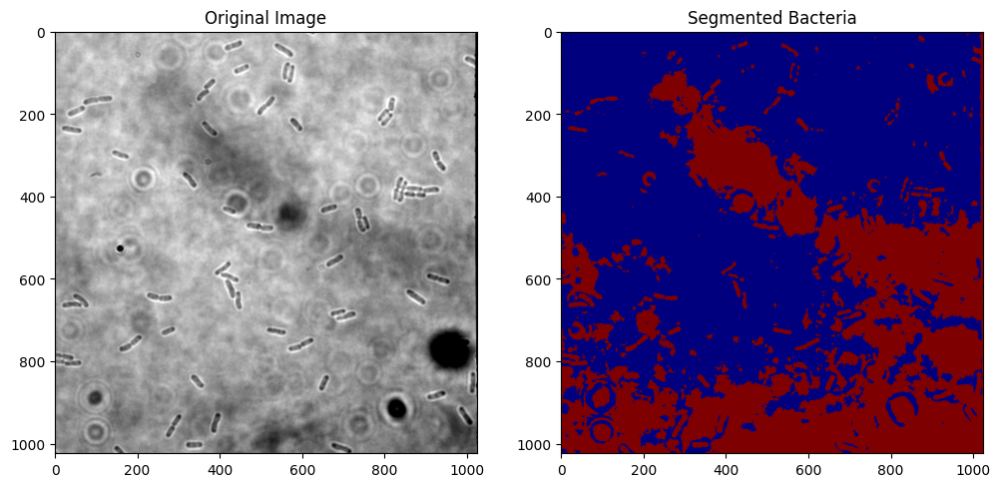

Bacterium 1: Stationary Phase
Bacterium 2: Decline Phase
Bacterium 3: Decline Phase
Bacterium 4: Decline Phase
Bacterium 5: Stationary Phase
Bacterium 6: Decline Phase
Bacterium 7: Decline Phase
Bacterium 8: Stationary Phase
Bacterium 9: Decline Phase
Bacterium 10: Stationary Phase
Bacterium 11: Decline Phase
Bacterium 12: Decline Phase
Bacterium 13: Decline Phase
Bacterium 14: Decline Phase
Bacterium 15: Decline Phase
Bacterium 16: Decline Phase
Bacterium 17: Stationary Phase
Bacterium 18: Stationary Phase
Bacterium 19: Decline Phase
Bacterium 20: Stationary Phase
Bacterium 21: Stationary Phase
Bacterium 22: Decline Phase
Bacterium 23: Exponential Phase
Bacterium 24: Stationary Phase
Bacterium 25: Decline Phase
Bacterium 26: Decline Phase
Bacterium 27: Decline Phase
Bacterium 28: Decline Phase
Bacterium 29: Decline Phase
Bacterium 30: Decline Phase
Bacterium 31: Decline Phase
Bacterium 32: Decline Phase
Bacterium 33: Decline Phase
Bacterium 34: Decline Phase
Bacterium 35: Decline Phas

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, measure, morphology, filters, segmentation
from sklearn.cluster import KMeans

# Load Image (Handles Both Color and Grayscale TIFF)
image_path = "/content/pos2_fr_1.tif"
image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)  # Load without auto conversion

# Convert to grayscale if needed
if len(image.shape) == 3:  # If 3D, it's color (BGR)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
else:  # If 2D, it's already grayscale
    gray = image

# Apply Gaussian Blur to reduce noise
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

### ---- 1️⃣ SEGMENTATION METHODS ---- ###

# **K-Means Segmentation**
def kmeans_segmentation(image, k=2):
    reshaped = image.reshape((-1, 1))
    kmeans = KMeans(n_clusters=k, n_init=10).fit(reshaped)
    segmented = kmeans.labels_.reshape(image.shape)
    return segmented

# **Mean-Shift Segmentation**
def mean_shift_segmentation(image):
    img_reshaped = np.float32(image.reshape((-1, 1)))
    _, labels, _ = cv2.kmeans(img_reshaped, 2, None, (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0), 10, cv2.KMEANS_RANDOM_CENTERS)
    return labels.reshape(image.shape)

# **Graph-Based Segmentation**
def graph_based_segmentation(image):
    return segmentation.felzenszwalb(image, scale=50, sigma=0.5, min_size=20)

# Choose the best segmentation method
segmented_image = kmeans_segmentation(blurred)  # Try different methods here

# Convert segmented image to binary (Thresholding)
binary = (segmented_image > 0).astype(np.uint8)

# Remove small noisy components using Morphological Opening
binary = morphology.remove_small_objects(binary.astype(bool), min_size=50).astype(np.uint8)

### ---- 2️⃣ OBJECT DETECTION & REGION PROCESSING ---- ###

# Find connected components (bacteria)
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)

# Store bacteria properties
growth_stage_labels = []

# Loop through each detected bacterium
for i in range(1, num_labels):  # Skip background (label 0)
    area = stats[i, cv2.CC_STAT_AREA]
    width = stats[i, cv2.CC_STAT_WIDTH]
    height = stats[i, cv2.CC_STAT_HEIGHT]

    aspect_ratio = width / height if height > 0 else 1  # Avoid division by zero

    # **Growth Stage Classification**
    if area < 50 and aspect_ratio < 1.2:
        stage = "Lag Phase"  # Small round bacteria
    elif aspect_ratio > 2.0:
        stage = "Exponential Phase"  # Elongated shape
    elif area > 200 and aspect_ratio < 1.5:
        stage = "Stationary Phase"  # Dividing or clustered
    else:
        stage = "Decline Phase"  # Irregular shape

    growth_stage_labels.append((i, stage))

### ---- 3️⃣ DISPLAY RESULTS ---- ###

# Show segmented result
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(gray, cmap="gray")
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(segmented_image, cmap="jet")
plt.title("Segmented Bacteria")
plt.show()

# Print Growth Stage Classification
for label, stage in growth_stage_labels:
    print(f"Bacterium {label}: {stage}")



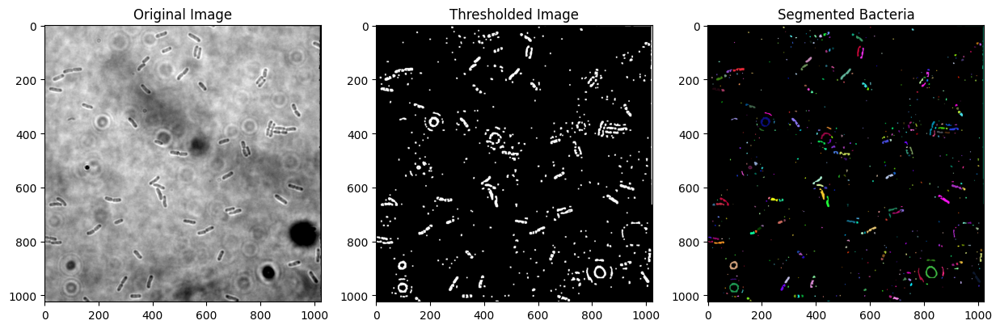

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the grayscale image
image_path = '/content/pos2_fr_1.tif'
gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Gaussian Blur to reduce noise while preserving edges
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Apply adaptive thresholding for better segmentation
thresh = cv2.adaptiveThreshold(
    blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 21, 5
)

# Remove small noise using morphological operations
kernel = np.ones((3, 3), np.uint8)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

# Distance transform for better separation
dist_transform = cv2.distanceTransform(thresh, cv2.DIST_L2, 5)
norm_dist_transform = cv2.normalize(dist_transform, None, 0, 1.0, cv2.NORM_MINMAX)
_, sure_fg = cv2.threshold(norm_dist_transform, 0.3, 1.0, cv2.THRESH_BINARY)
sure_fg = np.uint8(sure_fg * 255)

# Find unknown region
unknown = cv2.subtract(thresh, sure_fg)

# Label connected components
_, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1  # Ensure background is not 0
markers[unknown == 255] = 0  # Mark unknown regions as 0

# Convert grayscale to BGR for visualization
image_color = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)

# Apply Watershed algorithm
cv2.watershed(image_color, markers)

# Assign unique colors to segmented bacteria
segmented_image = np.zeros_like(image_color, dtype=np.uint8)
unique_labels = np.unique(markers)

for label in unique_labels:
    if label in [-1, 1]:  # Skip background and boundary markers
        continue
    mask = markers == label
    color = np.random.randint(0, 255, size=(1, 3), dtype=np.uint8)
    segmented_image[mask] = color

# Display results
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(gray, cmap='gray')
axes[0].set_title('Original Image')
axes[1].imshow(thresh, cmap='gray')
axes[1].set_title('Thresholded Image')
axes[2].imshow(segmented_image)
axes[2].set_title('Segmented Bacteria')
plt.show()


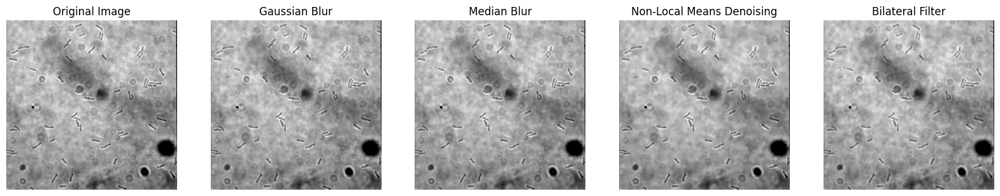

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import remove_small_objects

# Load the image
image_path = "pos2_fr_1.tif"  # Update with your actual file path
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply various denoising techniques
# 1. Gaussian Blur
gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)

# 2. Median Blur
median_blur = cv2.medianBlur(image, 5)

# 3. Non-Local Means Denoising
nlm_denoised = cv2.fastNlMeansDenoising(image, h=10, templateWindowSize=7, searchWindowSize=21)

# 4. Bilateral Filter
bilateral_filtered = cv2.bilateralFilter(image, 9, 75, 75)

# Display results
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
axes[0].imshow(image, cmap='gray')
axes[0].set_title("Original Image")
axes[1].imshow(gaussian_blur, cmap='gray')
axes[1].set_title("Gaussian Blur")
axes[2].imshow(median_blur, cmap='gray')
axes[2].set_title("Median Blur")
axes[3].imshow(nlm_denoised, cmap='gray')
axes[3].set_title("Non-Local Means Denoising")
axes[4].imshow(bilateral_filtered, cmap='gray')
axes[4].set_title("Bilateral Filter")

for ax in axes:
    ax.axis("off")

plt.show()


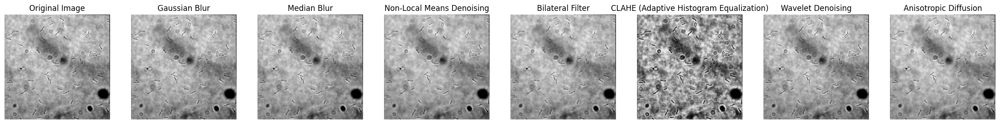

In [ ]:
!pip install PyWavelets

import cv2
import numpy as np
import matplotlib.pyplot as plt
import pywt
from skimage.restoration import denoise_tv_chambolle

# Load the image
image_path = "pos2_fr_1.tif"  # Update with your actual file path
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# 1. Gaussian Blur
gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)

# 2. Median Blur
median_blur = cv2.medianBlur(image, 5)

# 3. Non-Local Means Denoising
nlm_denoised = cv2.fastNlMeansDenoising(image, h=10, templateWindowSize=7, searchWindowSize=21)

# 4. Bilateral Filter
bilateral_filtered = cv2.bilateralFilter(image, 9, 75, 75)

# 5. Adaptive Histogram Equalization (CLAHE)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_applied = clahe.apply(image)

# 6. Wavelet Denoising
coeffs2 = pywt.dwt2(image, 'haar')
LL, (LH, HL, HH) = coeffs2
wavelet_denoised = pywt.idwt2((LL, (None, None, None)), 'haar')

# 7. Anisotropic Diffusion
tv_denoised = denoise_tv_chambolle(image, weight=0.1)

# Display results with CLAHE included
fig, axes = plt.subplots(1, 8, figsize=(28, 5))
axes[0].imshow(image, cmap='gray')
axes[0].set_title("Original Image")
axes[1].imshow(gaussian_blur, cmap='gray')
axes[1].set_title("Gaussian Blur")
axes[2].imshow(median_blur, cmap='gray')
axes[2].set_title("Median Blur")
axes[3].imshow(nlm_denoised, cmap='gray')
axes[3].set_title("Non-Local Means Denoising")
axes[4].imshow(bilateral_filtered, cmap='gray')
axes[4].set_title("Bilateral Filter")
axes[5].imshow(clahe_applied, cmap='gray')  # ADDING CLAHE PLOT
axes[5].set_title("CLAHE (Adaptive Histogram Equalization)")
axes[6].imshow(wavelet_denoised, cmap='gray')
axes[6].set_title("Wavelet Denoising")
axes[7].imshow(tv_denoised, cmap='gray')
axes[7].set_title("Anisotropic Diffusion")

for ax in axes:
    ax.axis("off")

plt.show()



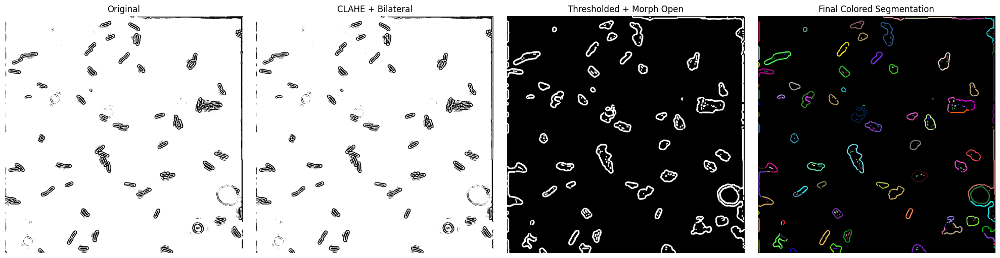

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# -------------------------
# 1. LOAD GRAYSCALE IMAGE
# -------------------------
image_path = "/content/frangi_components_output.png"  # Update with your path
gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# -------------------------
# 2. ENHANCE CONTRAST (CLAHE)
# -------------------------
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_applied = clahe.apply(gray)

# -------------------------
# 3. EDGE-PRESERVING SMOOTHING (Bilateral Filter)
# -------------------------
# Reduces noise while preserving edges
bilateral_filtered = cv2.bilateralFilter(clahe_applied, d=9, sigmaColor=75, sigmaSpace=75)

# (OPTIONAL) Top-Hat Transform if you want to highlight bright edges
kernel_tophat = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))
top_hat = cv2.morphologyEx(bilateral_filtered, cv2.MORPH_TOPHAT, kernel_tophat)
image_for_threshold = top_hat


# -------------------------
# 4. ADAPTIVE THRESHOLD
# -------------------------
# Using the same approach as your code: threshold -> morphological opening
thresh = cv2.adaptiveThreshold(
    image_for_threshold,
    255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY_INV,
    21,
    5
)

# Remove small noise using morphological OPEN
kernel = np.ones((3, 3), np.uint8)
opened = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

# -------------------------
# 5. DISTANCE TRANSFORM FOR BETTER SEPARATION
# -------------------------
dist_transform = cv2.distanceTransform(opened, cv2.DIST_L2, 5)
norm_dist_transform = cv2.normalize(dist_transform, None, 0, 1.0, cv2.NORM_MINMAX)
_, sure_fg = cv2.threshold(norm_dist_transform, 0.3, 1.0, cv2.THRESH_BINARY)
sure_fg = np.uint8(sure_fg * 255)

# Unknown region
unknown = cv2.subtract(opened, sure_fg)

# -------------------------
# 6. CONNECTED COMPONENTS & WATERSHED
# -------------------------
_, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1  # Ensure background is not 0
markers[unknown == 255] = 0

# Convert grayscale to BGR for watershed
image_color = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)
cv2.watershed(image_color, markers)

# -------------------------
# 7. COLOR EACH SEGMENTED BACTERIUM UNIQUELY
# -------------------------
segmented_image = np.zeros_like(image_color, dtype=np.uint8)
unique_labels = np.unique(markers)

for label in unique_labels:
    if label in [-1, 1]:  # Skip background/boundary
        continue
    mask = (markers == label)
    color = np.random.randint(0, 255, size=(1, 3), dtype=np.uint8)
    segmented_image[mask] = color

# -------------------------
# 8. DISPLAY RESULTS
# -------------------------
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(gray, cmap='gray')
axes[0].set_title("Original")

axes[1].imshow(bilateral_filtered, cmap='gray')
axes[1].set_title("CLAHE + Bilateral")

axes[2].imshow(opened, cmap='gray')
axes[2].set_title("Thresholded + Morph Open")

axes[3].imshow(segmented_image)
axes[3].set_title("Final Colored Segmentation")

for ax in axes:
    ax.axis("off")

plt.tight_layout()
plt.show()


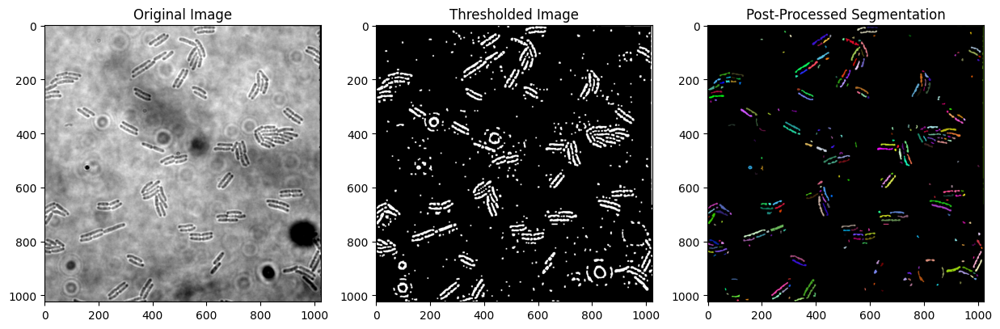

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# -------------------------
# Baseline Segmentation (Your Existing Code)
# -------------------------
image_path = '/content/pos2_fr_80.tif'
gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# 1. Gaussian Blur
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# 2. Adaptive Threshold (Binary Inversion)
thresh = cv2.adaptiveThreshold(
    blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 21, 5
)

# 3. Morphological Opening to remove small noise
kernel = np.ones((3, 3), np.uint8)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

# 4. Distance Transform
dist_transform = cv2.distanceTransform(thresh, cv2.DIST_L2, 5)
norm_dist_transform = cv2.normalize(dist_transform, None, 0, 1.0, cv2.NORM_MINMAX)
_, sure_fg = cv2.threshold(norm_dist_transform, 0.3, 1.0, cv2.THRESH_BINARY)
sure_fg = np.uint8(sure_fg * 255)

# 5. Unknown region
unknown = cv2.subtract(thresh, sure_fg)

# 6. Connected Components
_, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0

# 7. Watershed
image_color = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)
cv2.watershed(image_color, markers)

# ---------------------------------------------------------
# POST-PROCESSING to handle your 3 issues
# ---------------------------------------------------------
# We'll analyze each region's area and shape, remove small/circular ones,
# and optionally merge close fragments.

# Convert 'markers' to a mask for each label
h, w = gray.shape
label_mask = np.zeros((h, w), dtype=np.int32)
label_mask[:] = markers

# Step A: Gather stats for each label
# We'll store (label_id, area, centroid, bounding_box, aspect_ratio, etc.)
stats = {}
unique_labels = np.unique(label_mask)

for label_id in unique_labels:
    if label_id in [-1, 0, 1]:
        # -1 is watershed boundary, 0 is unknown, 1 is background
        continue
    # Create a mask for this label
    single_mask = (label_mask == label_id).astype(np.uint8)

    # Find contours to compute shape features
    contours, _ = cv2.findContours(single_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        continue
    c = contours[0]  # There should be only one main contour for each label
    area = cv2.contourArea(c)

    # Compute bounding box
    x, y, w_box, h_box = cv2.boundingRect(c)
    aspect_ratio = max(w_box, h_box) / float(min(w_box, h_box) + 1e-5)

    # Centroid
    M = cv2.moments(c)
    if M["m00"] != 0:
        cx = int(M["m10"] / M["m00"])
        cy = int(M["m01"] / M["m00"])
    else:
        cx, cy = 0, 0

    stats[label_id] = {
        'area': area,
        'aspect_ratio': aspect_ratio,
        'centroid': (cx, cy),
        'bbox': (x, y, w_box, h_box)
    }

# Step B: Filter out unwanted objects
# 1) Remove "very small" objects (colored dots).
# 2) Remove circular/round objects (like rings).
#    We'll use aspect ratio to discard near-1 shapes if you like, or you can skip if rods can also be ~1.
#    Another approach is to measure 'circularity' or 'solidity'.

MIN_AREA = 20         # min area to keep (adjust as needed)
MIN_ASPECT = 1.1      # rods typically have aspect ratio >= 1.5, adjust as needed
#   (If rods can be short, you may lower it to 1.2 or so.
#    If you only want elongated rods, keep it higher.)

valid_labels = set()
for label_id, info in stats.items():
    if info['area'] < MIN_AREA:
        # Too small -> discard
        continue
    if info['aspect_ratio'] < MIN_ASPECT:
        # Too circular -> discard
        continue
    valid_labels.add(label_id)

# Step C: Merge close fragments
# Some rods are broken into 2-3 pieces. We'll do a simple approach:
# If two labels' centroids are very close, we merge them.
# Alternatively, morphological bridging is another approach.

MERGE_DIST = 10  # if two centroids are <10px apart, merge them
# Build adjacency
labels_to_merge = {}  # label -> merges into label
valid_labels = list(valid_labels)

for i in range(len(valid_labels)):
    for j in range(i+1, len(valid_labels)):
        lid1 = valid_labels[i]
        lid2 = valid_labels[j]
        c1 = stats[lid1]['centroid']
        c2 = stats[lid2]['centroid']
        dist = np.hypot(c1[0] - c2[0], c1[1] - c2[1])
        if dist < MERGE_DIST:
            # Merge smaller area label into bigger area label
            if stats[lid1]['area'] > stats[lid2]['area']:
                labels_to_merge[lid2] = lid1
            else:
                labels_to_merge[lid1] = lid2

# Reassign label_mask based on merges
for old_label, new_label in labels_to_merge.items():
    label_mask[label_mask == old_label] = new_label

# Now re-collect the final set of labels
final_labels = np.unique(label_mask)

# Step D: Create a new segmented_image with the final labels
segmented_image = np.zeros_like(image_color, dtype=np.uint8)
for flabel in final_labels:
    if flabel in [-1, 0, 1]:
        continue
    # If flabel was invalid or merged, skip it
    if flabel not in valid_labels and flabel not in labels_to_merge.values():
        continue
    mask = (label_mask == flabel)
    color = np.random.randint(0, 255, size=(1, 3), dtype=np.uint8)
    segmented_image[mask] = color

# ---------------------------------------------------------
# Visualization
# ---------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(gray, cmap='gray')
axes[0].set_title('Original Image')

axes[1].imshow(thresh, cmap='gray')
axes[1].set_title('Thresholded Image')

axes[2].imshow(segmented_image)
axes[2].set_title('Post-Processed Segmentation')
plt.show()


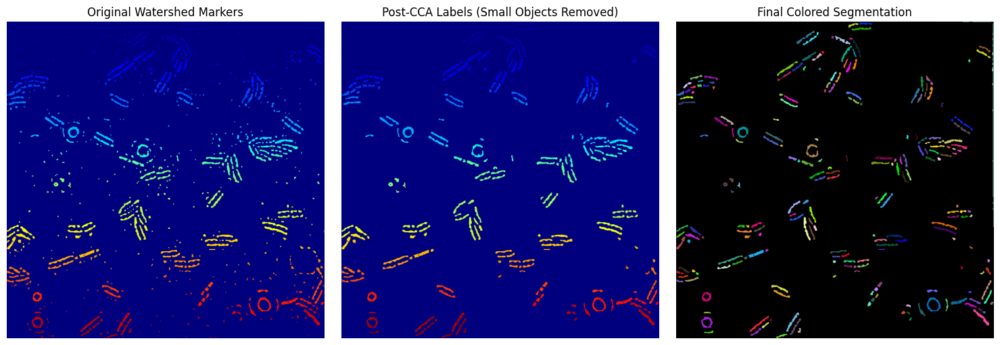

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1) Create a Binary Mask from Watershed 'markers'
# ---------------------------------------------------------
# 'markers' includes:
#   -1 = watershed boundary
#    0 = unknown region
#    1 = background
#   >1 = foreground objects (bacteria)
binary_mask = (markers > 1).astype(np.uint8)  # 1 where label>1, else 0

# ---------------------------------------------------------
# 2) Connected Component Analysis
# ---------------------------------------------------------
num_labels, labels_cc, stats, centroids = cv2.connectedComponentsWithStats(
    binary_mask, connectivity=8
)

# stats[i] has: [x, y, width, height, area] for label i
# labels_cc is a new label map for each connected component

# ---------------------------------------------------------
# 3) Remove Small Objects by Area
# ---------------------------------------------------------
MIN_AREA = 50  # Adjust as needed
for i in range(1, num_labels):  # 0 is background
    area = stats[i, cv2.CC_STAT_AREA]
    if area < MIN_AREA:
        # Remove this label
        labels_cc[labels_cc == i] = 0

# ---------------------------------------------------------
# 4) Reassign Labels After Removal
# ---------------------------------------------------------
unique_labels = np.unique(labels_cc)
remap_dict = {}
new_label_id = 1

for lbl in unique_labels:
    if lbl == 0:
        remap_dict[lbl] = 0  # keep background as 0
    else:
        remap_dict[lbl] = new_label_id
        new_label_id += 1

final_labels = np.zeros_like(labels_cc, dtype=np.uint8)
for lbl in unique_labels:
    final_labels[labels_cc == lbl] = remap_dict[lbl]

# ---------------------------------------------------------
# 5) Color the Final Labels
# ---------------------------------------------------------
h, w = markers.shape
colored_output = np.zeros((h, w, 3), dtype=np.uint8)

for lbl in range(1, new_label_id):
    color = np.random.randint(0, 255, size=3, dtype=np.uint8)
    colored_output[final_labels == lbl] = color

# ---------------------------------------------------------
# Visualization
# ---------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(markers, cmap='jet')
axes[0].set_title("Original Watershed Markers")

axes[1].imshow(final_labels, cmap='jet')
axes[1].set_title("Post-CCA Labels (Small Objects Removed)")

axes[2].imshow(colored_output)
axes[2].set_title("Final Colored Segmentation")

for ax in axes:
    ax.axis("off")

plt.tight_layout()
plt.show()


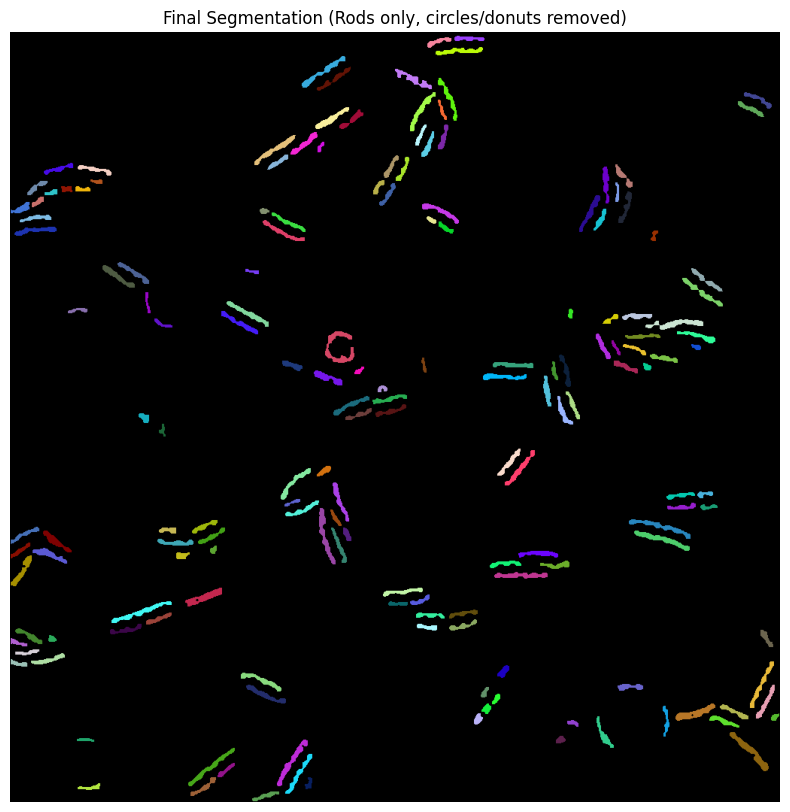

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import regionprops
from skimage.morphology import remove_small_objects

# ----- Parameters -----
MIN_AREA = 70            # Minimum area to consider (remove small objects)
MIN_ASPECT_RATIO = 1.2  # Minimum aspect ratio to consider an object as rod-like
MIN_SOLIDITY = 0.1      # Minimum solidity to exclude donut shapes

# Create a copy of the markers for filtering
filtered_markers = np.copy(markers)

# Compute region properties on the watershed markers
props = regionprops(markers, intensity_image=gray)

# Loop over each segmented object and filter out unwanted ones
for prop in props:
    label_id = prop.label
    # Skip background and watershed boundaries (commonly labeled as -1 and 1)
    if label_id in [-1, 0, 1]:
        continue

    area = prop.area
    if area < MIN_AREA:
        # Remove small objects
        filtered_markers[markers == label_id] = 0
        continue

    # Compute aspect ratio (using the major and minor axis lengths)
    # Adding a small value to avoid division by zero.
    aspect_ratio = prop.major_axis_length / (prop.minor_axis_length + 1e-5)
    solidity = prop.solidity  # Ratio of area to convex area

    # Filter out objects that are too circular (low aspect ratio) or have low solidity (donut shapes)
    if aspect_ratio < MIN_ASPECT_RATIO or solidity < MIN_SOLIDITY:
        filtered_markers[markers == label_id] = 0

# Re-label the filtered markers (i.e. perform connected components on the refined mask)
# Create a binary mask from the filtered markers (foreground: markers > 1)
binary_mask = (filtered_markers > 1).astype(np.uint8)
num_labels, final_labels = cv2.connectedComponents(binary_mask, connectivity=8)

# Color-code each remaining segment
h, w = gray.shape
colored_output = np.zeros((h, w, 3), dtype=np.uint8)
for lbl in range(1, num_labels):  # Start at 1 to skip background
    color = np.random.randint(0, 255, size=3, dtype=np.uint8)
    colored_output[final_labels == lbl] = color

# Display the final color-coded segmentation
plt.figure(figsize=(10, 10))
plt.imshow(colored_output)
plt.title("Final Segmentation (Rods only, circles/donuts removed)")
plt.axis("off")
plt.show()


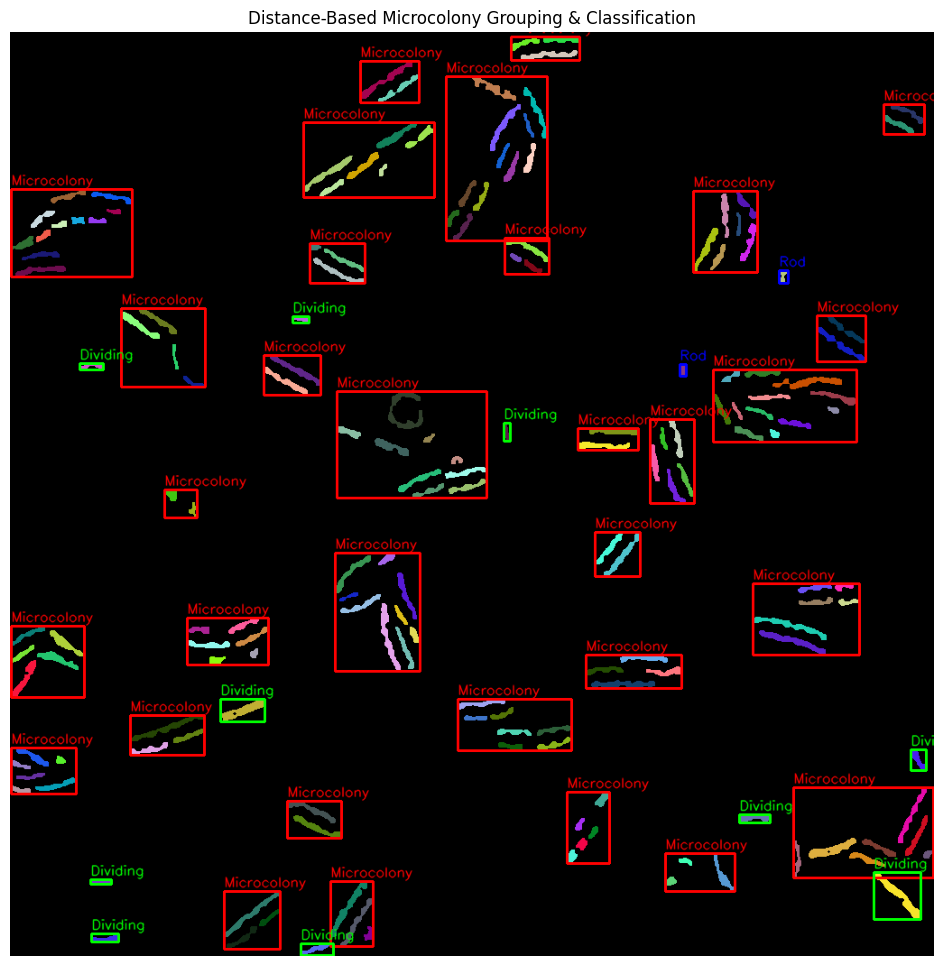

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import regionprops

# ---------------------------------------------------------
# 1) final_labels: integer mask where 0=background, 1..N=distinct objects
#    colored_output: a color-coded segmentation image from your prior steps
#    gray: grayscale image (used in regionprops, if needed)
# ---------------------------------------------------------

# ----- Thresholds (tune these to your dataset!) -----
MIN_ROD_AREA = 70
DIVIDING_ASPECT_RATIO = 3.0
MICROCOLONY_AREA_THRESHOLD = 400  # total area threshold for grouping
DISTANCE_THRESHOLD = 50           # distance (in pixels) to consider objects "close"

# Convert to BGR if 'colored_output' is in RGB (for OpenCV drawing)
output_for_drawing = cv2.cvtColor(colored_output, cv2.COLOR_RGB2BGR)

# Obtain region properties
props = regionprops(final_labels)

# Collect objects into a list with relevant info
objects_data = []
for prop in props:
    label_id = prop.label
    if label_id == 0:
        continue  # skip background

    area = prop.area
    # Skip very small noise
    if area < MIN_ROD_AREA:
        continue

    major_len = prop.major_axis_length
    minor_len = prop.minor_axis_length + 1e-5  # avoid division by zero
    aspect_ratio = major_len / minor_len
    centroid = prop.centroid  # (row, col)
    bbox = prop.bbox          # (min_row, min_col, max_row, max_col)

    objects_data.append({
        'label': label_id,
        'area': area,
        'aspect_ratio': aspect_ratio,
        'centroid': centroid,
        'bbox': bbox
    })

# ----- 2) Build adjacency (distance-based) -----
N = len(objects_data)
adj_list = [[] for _ in range(N)]

for i in range(N):
    r1, c1 = objects_data[i]['centroid']
    for j in range(i + 1, N):
        r2, c2 = objects_data[j]['centroid']
        dist = np.sqrt((r1 - r2)**2 + (c1 - c2)**2)
        if dist < DISTANCE_THRESHOLD:
            adj_list[i].append(j)
            adj_list[j].append(i)

# ----- 3) Find clusters via BFS -----
visited = [False] * N
clusters = []

for i in range(N):
    if not visited[i]:
        queue = [i]
        visited[i] = True
        cluster_indices = []

        while queue:
            current = queue.pop(0)
            cluster_indices.append(current)
            for neigh in adj_list[current]:
                if not visited[neigh]:
                    visited[neigh] = True
                    queue.append(neigh)

        clusters.append(cluster_indices)

# Helper to compute bounding box for an entire cluster
def get_cluster_bbox(cluster_idxs, data_list):
    minr = float('inf')
    minc = float('inf')
    maxr = -1
    maxc = -1
    total_area = 0
    for idx in cluster_idxs:
        r1, c1, r2, c2 = data_list[idx]['bbox']
        if r1 < minr: minr = r1
        if c1 < minc: minc = c1
        if r2 > maxr: maxr = r2
        if c2 > maxc: maxc = c2
        total_area += data_list[idx]['area']
    return (minr, minc, maxr, maxc, total_area)

# ----- 4) Classify Each Cluster -----
COLOR_MAP = {
    "Microcolony": (0, 0, 255),   # BGR: red
    "Dividing":     (0, 255, 0),  # BGR: green
    "Rod":          (255, 0, 0),  # BGR: blue
}

for cluster in clusters:
    # Calculate the bounding box of this entire cluster
    minr, minc, maxr, maxc, total_area = get_cluster_bbox(cluster, objects_data)
    cluster_size = len(cluster)

    # Decide on a class label:
    if cluster_size > 1:
        # More than one object close together => likely microcolony
        # You could also check total_area or other shape descriptors
        if total_area > MICROCOLONY_AREA_THRESHOLD:
            class_name = "Microcolony"
        else:
            # Possibly a smaller cluster of 2 rods - you might call it dividing
            # or microcolony depending on your domain knowledge
            # For example, if it's 2 rods stuck together:
            class_name = "Microcolony"  # or "Dividing"
    else:
        # Only one object in the cluster => check aspect ratio
        idx = cluster[0]
        aspect_ratio = objects_data[idx]['aspect_ratio']
        if aspect_ratio > DIVIDING_ASPECT_RATIO:
            class_name = "Dividing"
        else:
            class_name = "Rod"

    # Draw bounding box around the cluster
    color = COLOR_MAP[class_name]
    cv2.rectangle(
        output_for_drawing,
        (minc, minr),  # (x, y) in OpenCV => (col, row)
        (maxc, maxr),
        color,
        2
    )
    # Put a label text
    cv2.putText(
        output_for_drawing,
        class_name,
        (minc, minr - 5),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,
        color,
        1,
        cv2.LINE_AA
    )

# Convert back to RGB for display with matplotlib
output_for_display = cv2.cvtColor(output_for_drawing, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 12))
plt.imshow(output_for_display)
plt.title("Distance-Based Microcolony Grouping & Classification")
plt.axis("off")
plt.show()


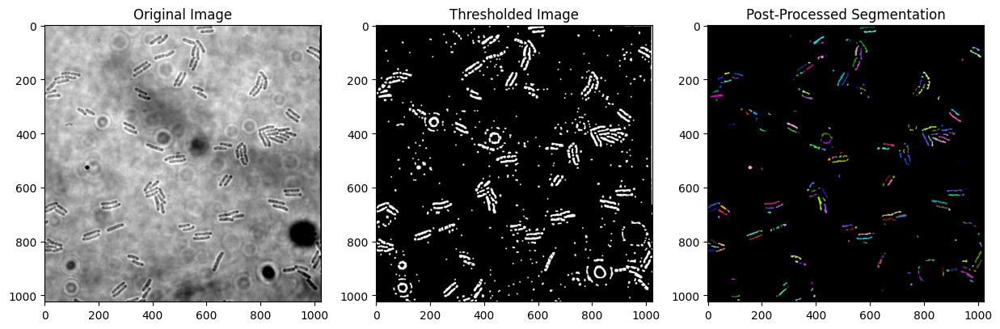

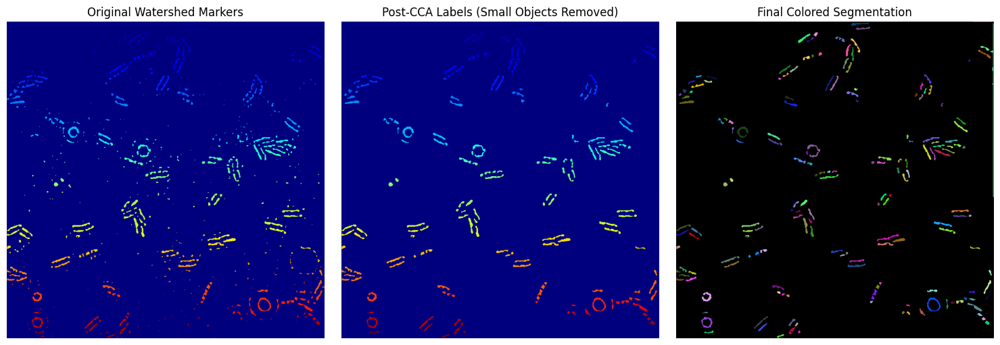

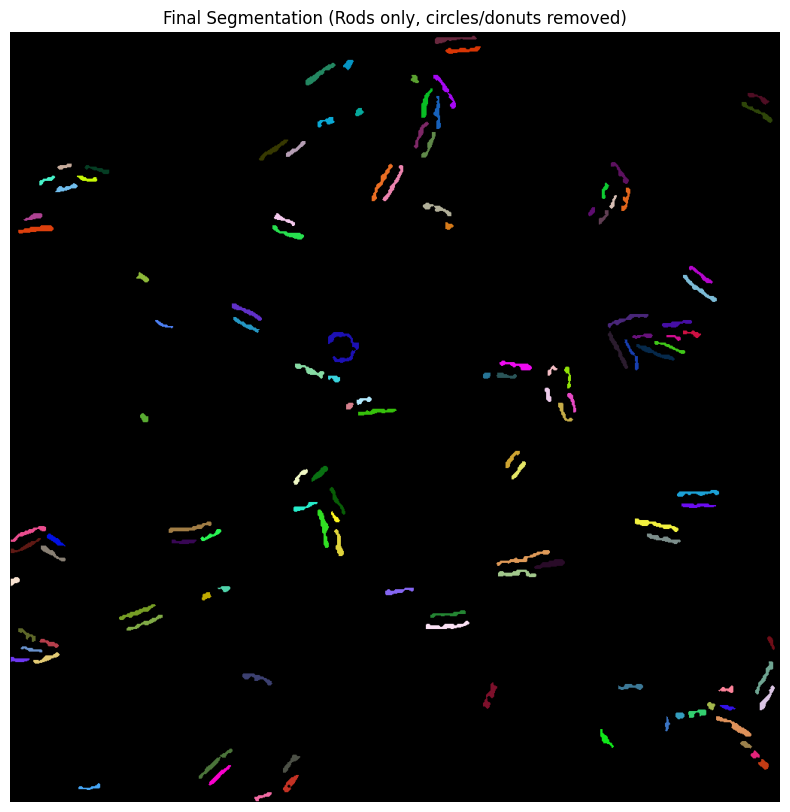

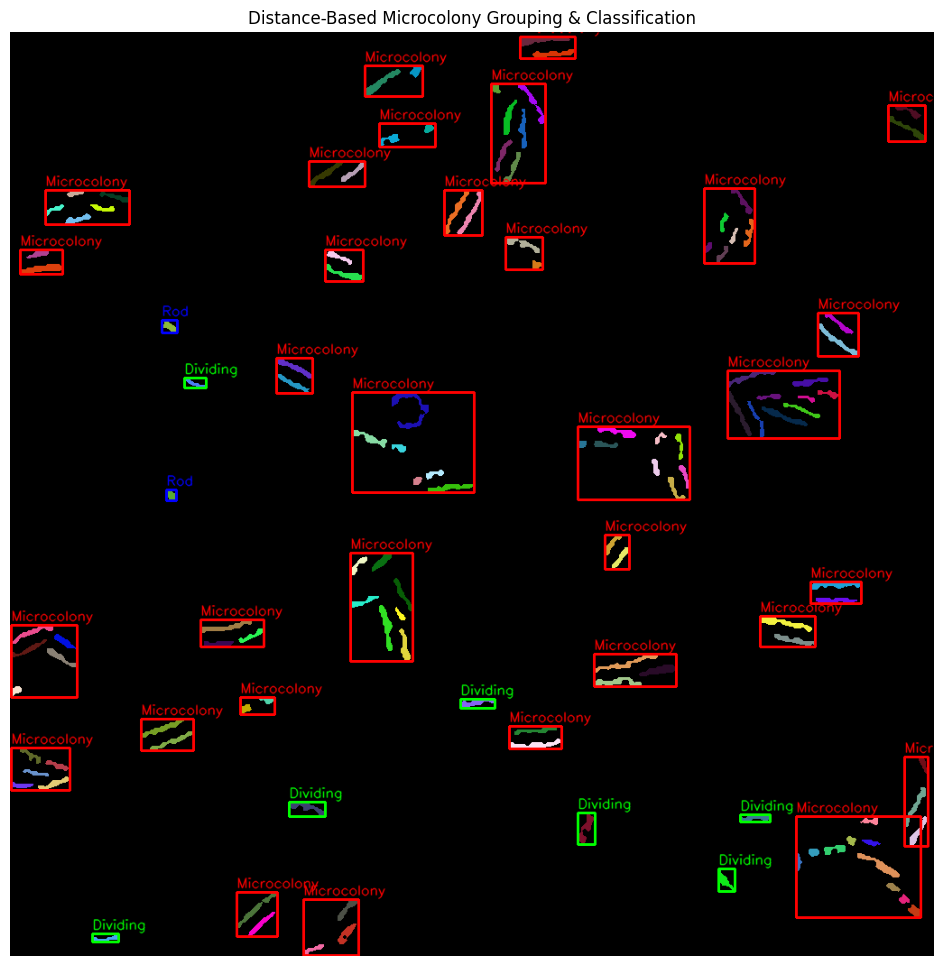

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# -------------------------
# Baseline Segmentation (Your Existing Code)
# -------------------------
image_path = '/content/pos2_fr_60.tif'
gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# 1. Gaussian Blur
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# 2. Adaptive Threshold (Binary Inversion)
thresh = cv2.adaptiveThreshold(
    blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 21, 5
)

# 3. Morphological Opening to remove small noise
kernel = np.ones((3, 3), np.uint8)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

# 4. Distance Transform
dist_transform = cv2.distanceTransform(thresh, cv2.DIST_L2, 5)
norm_dist_transform = cv2.normalize(dist_transform, None, 0, 1.0, cv2.NORM_MINMAX)
_, sure_fg = cv2.threshold(norm_dist_transform, 0.3, 1.0, cv2.THRESH_BINARY)
sure_fg = np.uint8(sure_fg * 255)

# 5. Unknown region
unknown = cv2.subtract(thresh, sure_fg)

# 6. Connected Components
_, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0

# 7. Watershed
image_color = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)
cv2.watershed(image_color, markers)

# ---------------------------------------------------------
# POST-PROCESSING to handle your 3 issues
# ---------------------------------------------------------
# We'll analyze each region's area and shape, remove small/circular ones,
# and optionally merge close fragments.

# Convert 'markers' to a mask for each label
h, w = gray.shape
label_mask = np.zeros((h, w), dtype=np.int32)
label_mask[:] = markers

# Step A: Gather stats for each label
# We'll store (label_id, area, centroid, bounding_box, aspect_ratio, etc.)
stats = {}
unique_labels = np.unique(label_mask)

for label_id in unique_labels:
    if label_id in [-1, 0, 1]:
        # -1 is watershed boundary, 0 is unknown, 1 is background
        continue
    # Create a mask for this label
    single_mask = (label_mask == label_id).astype(np.uint8)

    # Find contours to compute shape features
    contours, _ = cv2.findContours(single_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        continue
    c = contours[0]  # There should be only one main contour for each label
    area = cv2.contourArea(c)

    # Compute bounding box
    x, y, w_box, h_box = cv2.boundingRect(c)
    aspect_ratio = max(w_box, h_box) / float(min(w_box, h_box) + 1e-5)

    # Centroid
    M = cv2.moments(c)
    if M["m00"] != 0:
        cx = int(M["m10"] / M["m00"])
        cy = int(M["m01"] / M["m00"])
    else:
        cx, cy = 0, 0

    stats[label_id] = {
        'area': area,
        'aspect_ratio': aspect_ratio,
        'centroid': (cx, cy),
        'bbox': (x, y, w_box, h_box)
    }

# Step B: Filter out unwanted objects
# 1) Remove "very small" objects (colored dots).
# 2) Remove circular/round objects (like rings).
#    We'll use aspect ratio to discard near-1 shapes if you like, or you can skip if rods can also be ~1.
#    Another approach is to measure 'circularity' or 'solidity'.

MIN_AREA = 20         # min area to keep (adjust as needed)
MIN_ASPECT = 1.1      # rods typically have aspect ratio >= 1.5, adjust as needed
#   (If rods can be short, you may lower it to 1.2 or so.
#    If you only want elongated rods, keep it higher.)

valid_labels = set()
for label_id, info in stats.items():
    if info['area'] < MIN_AREA:
        # Too small -> discard
        continue
    if info['aspect_ratio'] < MIN_ASPECT:
        # Too circular -> discard
        continue
    valid_labels.add(label_id)

# Step C: Merge close fragments
# Some rods are broken into 2-3 pieces. We'll do a simple approach:
# If two labels' centroids are very close, we merge them.
# Alternatively, morphological bridging is another approach.

MERGE_DIST = 10  # if two centroids are <10px apart, merge them
# Build adjacency
labels_to_merge = {}  # label -> merges into label
valid_labels = list(valid_labels)

for i in range(len(valid_labels)):
    for j in range(i+1, len(valid_labels)):
        lid1 = valid_labels[i]
        lid2 = valid_labels[j]
        c1 = stats[lid1]['centroid']
        c2 = stats[lid2]['centroid']
        dist = np.hypot(c1[0] - c2[0], c1[1] - c2[1])
        if dist < MERGE_DIST:
            # Merge smaller area label into bigger area label
            if stats[lid1]['area'] > stats[lid2]['area']:
                labels_to_merge[lid2] = lid1
            else:
                labels_to_merge[lid1] = lid2

# Reassign label_mask based on merges
for old_label, new_label in labels_to_merge.items():
    label_mask[label_mask == old_label] = new_label

# Now re-collect the final set of labels
final_labels = np.unique(label_mask)

# Step D: Create a new segmented_image with the final labels
segmented_image = np.zeros_like(image_color, dtype=np.uint8)
for flabel in final_labels:
    if flabel in [-1, 0, 1]:
        continue
    # If flabel was invalid or merged, skip it
    if flabel not in valid_labels and flabel not in labels_to_merge.values():
        continue
    mask = (label_mask == flabel)
    color = np.random.randint(0, 255, size=(1, 3), dtype=np.uint8)
    segmented_image[mask] = color

# ---------------------------------------------------------
# Visualization
# ---------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(gray, cmap='gray')
axes[0].set_title('Original Image')

axes[1].imshow(thresh, cmap='gray')
axes[1].set_title('Thresholded Image')

axes[2].imshow(segmented_image)
axes[2].set_title('Post-Processed Segmentation')
plt.show()
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1) Create a Binary Mask from Watershed 'markers'
# ---------------------------------------------------------
# 'markers' includes:
#   -1 = watershed boundary
#    0 = unknown region
#    1 = background
#   >1 = foreground objects (bacteria)
binary_mask = (markers > 1).astype(np.uint8)  # 1 where label>1, else 0

# ---------------------------------------------------------
# 2) Connected Component Analysis
# ---------------------------------------------------------
num_labels, labels_cc, stats, centroids = cv2.connectedComponentsWithStats(
    binary_mask, connectivity=8
)

# stats[i] has: [x, y, width, height, area] for label i
# labels_cc is a new label map for each connected component

# ---------------------------------------------------------
# 3) Remove Small Objects by Area
# ---------------------------------------------------------
MIN_AREA = 50  # Adjust as needed
for i in range(1, num_labels):  # 0 is background
    area = stats[i, cv2.CC_STAT_AREA]
    if area < MIN_AREA:
        # Remove this label
        labels_cc[labels_cc == i] = 0

# ---------------------------------------------------------
# 4) Reassign Labels After Removal
# ---------------------------------------------------------
unique_labels = np.unique(labels_cc)
remap_dict = {}
new_label_id = 1

for lbl in unique_labels:
    if lbl == 0:
        remap_dict[lbl] = 0  # keep background as 0
    else:
        remap_dict[lbl] = new_label_id
        new_label_id += 1

final_labels = np.zeros_like(labels_cc, dtype=np.uint8)
for lbl in unique_labels:
    final_labels[labels_cc == lbl] = remap_dict[lbl]

# ---------------------------------------------------------
# 5) Color the Final Labels
# ---------------------------------------------------------
h, w = markers.shape
colored_output = np.zeros((h, w, 3), dtype=np.uint8)

for lbl in range(1, new_label_id):
    color = np.random.randint(0, 255, size=3, dtype=np.uint8)
    colored_output[final_labels == lbl] = color

# ---------------------------------------------------------
# Visualization
# ---------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(markers, cmap='jet')
axes[0].set_title("Original Watershed Markers")

axes[1].imshow(final_labels, cmap='jet')
axes[1].set_title("Post-CCA Labels (Small Objects Removed)")

axes[2].imshow(colored_output)
axes[2].set_title("Final Colored Segmentation")

for ax in axes:
    ax.axis("off")

plt.tight_layout()
plt.show()
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import regionprops
from skimage.morphology import remove_small_objects

# ----- Parameters -----
MIN_AREA = 70            # Minimum area to consider (remove small objects)
MIN_ASPECT_RATIO = 1.2  # Minimum aspect ratio to consider an object as rod-like
MIN_SOLIDITY = 0.1      # Minimum solidity to exclude donut shapes

# Create a copy of the markers for filtering
filtered_markers = np.copy(markers)

# Compute region properties on the watershed markers
props = regionprops(markers, intensity_image=gray)

# Loop over each segmented object and filter out unwanted ones
for prop in props:
    label_id = prop.label
    # Skip background and watershed boundaries (commonly labeled as -1 and 1)
    if label_id in [-1, 0, 1]:
        continue

    area = prop.area
    if area < MIN_AREA:
        # Remove small objects
        filtered_markers[markers == label_id] = 0
        continue

    # Compute aspect ratio (using the major and minor axis lengths)
    # Adding a small value to avoid division by zero.
    aspect_ratio = prop.major_axis_length / (prop.minor_axis_length + 1e-5)
    solidity = prop.solidity  # Ratio of area to convex area

    # Filter out objects that are too circular (low aspect ratio) or have low solidity (donut shapes)
    if aspect_ratio < MIN_ASPECT_RATIO or solidity < MIN_SOLIDITY:
        filtered_markers[markers == label_id] = 0

# Re-label the filtered markers (i.e. perform connected components on the refined mask)
# Create a binary mask from the filtered markers (foreground: markers > 1)
binary_mask = (filtered_markers > 1).astype(np.uint8)
num_labels, final_labels = cv2.connectedComponents(binary_mask, connectivity=8)

# Color-code each remaining segment
h, w = gray.shape
colored_output = np.zeros((h, w, 3), dtype=np.uint8)
for lbl in range(1, num_labels):  # Start at 1 to skip background
    color = np.random.randint(0, 255, size=3, dtype=np.uint8)
    colored_output[final_labels == lbl] = color

# Display the final color-coded segmentation
plt.figure(figsize=(10, 10))
plt.imshow(colored_output)
plt.title("Final Segmentation (Rods only, circles/donuts removed)")
plt.axis("off")
plt.show()
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import regionprops

# ---------------------------------------------------------
# 1) final_labels: integer mask where 0=background, 1..N=distinct objects
#    colored_output: a color-coded segmentation image from your prior steps
#    gray: grayscale image (used in regionprops, if needed)
# ---------------------------------------------------------

# ----- Thresholds (tune these to your dataset!) -----
MIN_ROD_AREA = 70
DIVIDING_ASPECT_RATIO = 3.0
MICROCOLONY_AREA_THRESHOLD = 400  # total area threshold for grouping
DISTANCE_THRESHOLD = 50           # distance (in pixels) to consider objects "close"

# Convert to BGR if 'colored_output' is in RGB (for OpenCV drawing)
output_for_drawing = cv2.cvtColor(colored_output, cv2.COLOR_RGB2BGR)

# Obtain region properties
props = regionprops(final_labels)

# Collect objects into a list with relevant info
objects_data = []
for prop in props:
    label_id = prop.label
    if label_id == 0:
        continue  # skip background

    area = prop.area
    # Skip very small noise
    if area < MIN_ROD_AREA:
        continue

    major_len = prop.major_axis_length
    minor_len = prop.minor_axis_length + 1e-5  # avoid division by zero
    aspect_ratio = major_len / minor_len
    centroid = prop.centroid  # (row, col)
    bbox = prop.bbox          # (min_row, min_col, max_row, max_col)

    objects_data.append({
        'label': label_id,
        'area': area,
        'aspect_ratio': aspect_ratio,
        'centroid': centroid,
        'bbox': bbox
    })

# ----- 2) Build adjacency (distance-based) -----
N = len(objects_data)
adj_list = [[] for _ in range(N)]

for i in range(N):
    r1, c1 = objects_data[i]['centroid']
    for j in range(i + 1, N):
        r2, c2 = objects_data[j]['centroid']
        dist = np.sqrt((r1 - r2)**2 + (c1 - c2)**2)
        if dist < DISTANCE_THRESHOLD:
            adj_list[i].append(j)
            adj_list[j].append(i)

# ----- 3) Find clusters via BFS -----
visited = [False] * N
clusters = []

for i in range(N):
    if not visited[i]:
        queue = [i]
        visited[i] = True
        cluster_indices = []

        while queue:
            current = queue.pop(0)
            cluster_indices.append(current)
            for neigh in adj_list[current]:
                if not visited[neigh]:
                    visited[neigh] = True
                    queue.append(neigh)

        clusters.append(cluster_indices)

# Helper to compute bounding box for an entire cluster
def get_cluster_bbox(cluster_idxs, data_list):
    minr = float('inf')
    minc = float('inf')
    maxr = -1
    maxc = -1
    total_area = 0
    for idx in cluster_idxs:
        r1, c1, r2, c2 = data_list[idx]['bbox']
        if r1 < minr: minr = r1
        if c1 < minc: minc = c1
        if r2 > maxr: maxr = r2
        if c2 > maxc: maxc = c2
        total_area += data_list[idx]['area']
    return (minr, minc, maxr, maxc, total_area)

# ----- 4) Classify Each Cluster -----
COLOR_MAP = {
    "Microcolony": (0, 0, 255),   # BGR: red
    "Dividing":     (0, 255, 0),  # BGR: green
    "Rod":          (255, 0, 0),  # BGR: blue
}

for cluster in clusters:
    # Calculate the bounding box of this entire cluster
    minr, minc, maxr, maxc, total_area = get_cluster_bbox(cluster, objects_data)
    cluster_size = len(cluster)

    # Decide on a class label:
    if cluster_size > 1:
        # More than one object close together => likely microcolony
        # You could also check total_area or other shape descriptors
        if total_area > MICROCOLONY_AREA_THRESHOLD:
            class_name = "Microcolony"
        else:
            # Possibly a smaller cluster of 2 rods - you might call it dividing
            # or microcolony depending on your domain knowledge
            # For example, if it's 2 rods stuck together:
            class_name = "Microcolony"  # or "Dividing"
    else:
        # Only one object in the cluster => check aspect ratio
        idx = cluster[0]
        aspect_ratio = objects_data[idx]['aspect_ratio']
        if aspect_ratio > DIVIDING_ASPECT_RATIO:
            class_name = "Dividing"
        else:
            class_name = "Rod"

    # Draw bounding box around the cluster
    color = COLOR_MAP[class_name]
    cv2.rectangle(
        output_for_drawing,
        (minc, minr),  # (x, y) in OpenCV => (col, row)
        (maxc, maxr),
        color,
        2
    )
    # Put a label text
    cv2.putText(
        output_for_drawing,
        class_name,
        (minc, minr - 5),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,
        color,
        1,
        cv2.LINE_AA
    )

# Convert back to RGB for display with matplotlib
output_for_display = cv2.cvtColor(output_for_drawing, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 12))
plt.imshow(output_for_display)
plt.title("Distance-Based Microcolony Grouping & Classification")
plt.axis("off")
plt.show()


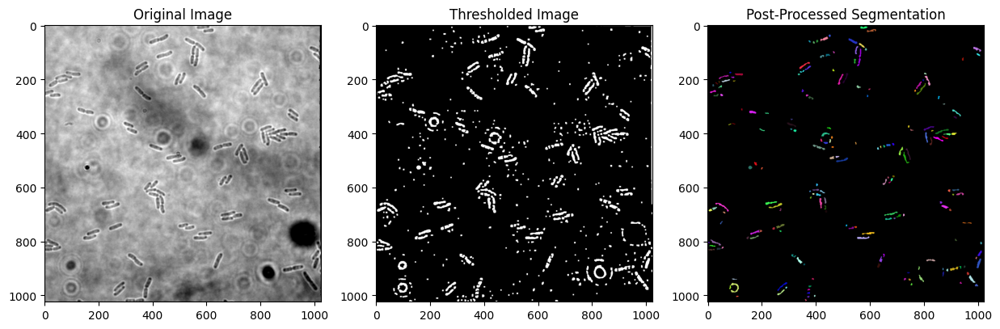

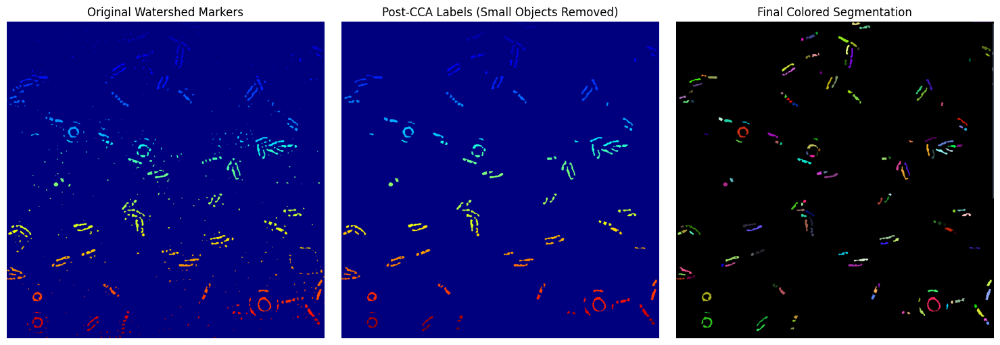

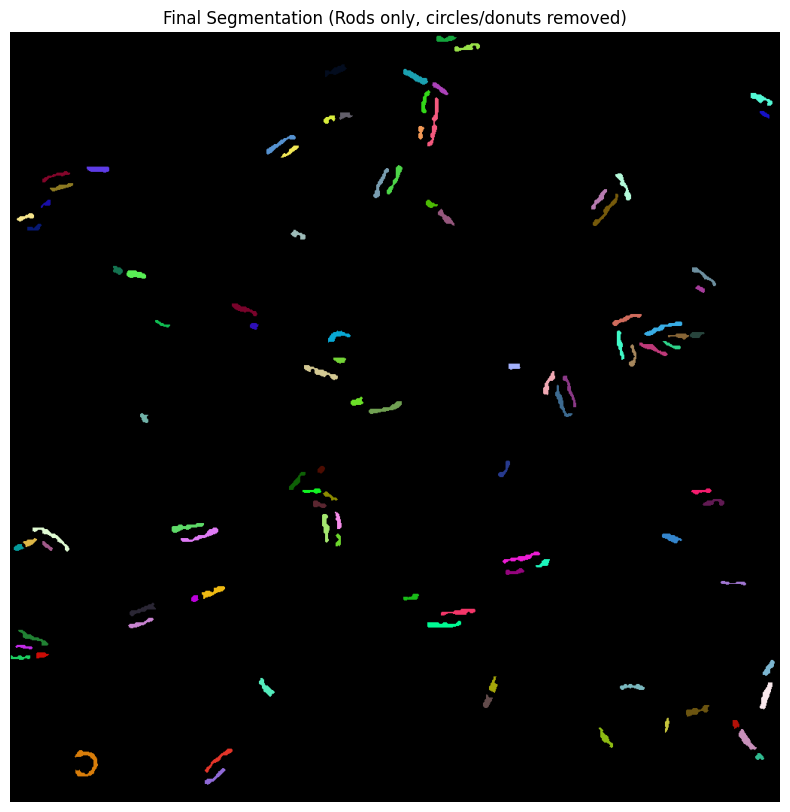

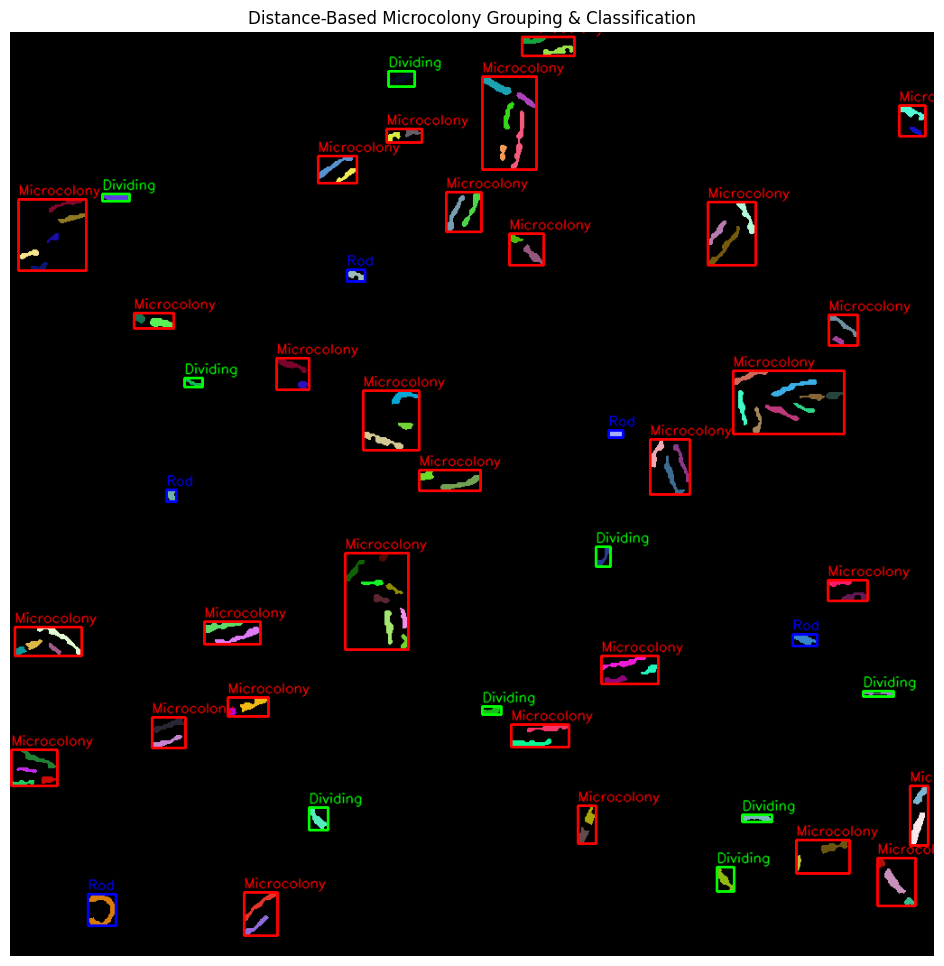

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# -------------------------
# Baseline Segmentation (Your Existing Code)
# -------------------------
image_path = '/content/pos2_fr_40.tif'
gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# 1. Gaussian Blur
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# 2. Adaptive Threshold (Binary Inversion)
thresh = cv2.adaptiveThreshold(
    blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 21, 5
)

# 3. Morphological Opening to remove small noise
kernel = np.ones((3, 3), np.uint8)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

# 4. Distance Transform
dist_transform = cv2.distanceTransform(thresh, cv2.DIST_L2, 5)
norm_dist_transform = cv2.normalize(dist_transform, None, 0, 1.0, cv2.NORM_MINMAX)
_, sure_fg = cv2.threshold(norm_dist_transform, 0.3, 1.0, cv2.THRESH_BINARY)
sure_fg = np.uint8(sure_fg * 255)

# 5. Unknown region
unknown = cv2.subtract(thresh, sure_fg)

# 6. Connected Components
_, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0

# 7. Watershed
image_color = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)
cv2.watershed(image_color, markers)

# ---------------------------------------------------------
# POST-PROCESSING to handle your 3 issues
# ---------------------------------------------------------
# We'll analyze each region's area and shape, remove small/circular ones,
# and optionally merge close fragments.

# Convert 'markers' to a mask for each label
h, w = gray.shape
label_mask = np.zeros((h, w), dtype=np.int32)
label_mask[:] = markers

# Step A: Gather stats for each label
# We'll store (label_id, area, centroid, bounding_box, aspect_ratio, etc.)
stats = {}
unique_labels = np.unique(label_mask)

for label_id in unique_labels:
    if label_id in [-1, 0, 1]:
        # -1 is watershed boundary, 0 is unknown, 1 is background
        continue
    # Create a mask for this label
    single_mask = (label_mask == label_id).astype(np.uint8)

    # Find contours to compute shape features
    contours, _ = cv2.findContours(single_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        continue
    c = contours[0]  # There should be only one main contour for each label
    area = cv2.contourArea(c)

    # Compute bounding box
    x, y, w_box, h_box = cv2.boundingRect(c)
    aspect_ratio = max(w_box, h_box) / float(min(w_box, h_box) + 1e-5)

    # Centroid
    M = cv2.moments(c)
    if M["m00"] != 0:
        cx = int(M["m10"] / M["m00"])
        cy = int(M["m01"] / M["m00"])
    else:
        cx, cy = 0, 0

    stats[label_id] = {
        'area': area,
        'aspect_ratio': aspect_ratio,
        'centroid': (cx, cy),
        'bbox': (x, y, w_box, h_box)
    }

# Step B: Filter out unwanted objects
# 1) Remove "very small" objects (colored dots).
# 2) Remove circular/round objects (like rings).
#    We'll use aspect ratio to discard near-1 shapes if you like, or you can skip if rods can also be ~1.
#    Another approach is to measure 'circularity' or 'solidity'.

MIN_AREA = 20         # min area to keep (adjust as needed)
MIN_ASPECT = 1.1      # rods typically have aspect ratio >= 1.5, adjust as needed
#   (If rods can be short, you may lower it to 1.2 or so.
#    If you only want elongated rods, keep it higher.)

valid_labels = set()
for label_id, info in stats.items():
    if info['area'] < MIN_AREA:
        # Too small -> discard
        continue
    if info['aspect_ratio'] < MIN_ASPECT:
        # Too circular -> discard
        continue
    valid_labels.add(label_id)

# Step C: Merge close fragments
# Some rods are broken into 2-3 pieces. We'll do a simple approach:
# If two labels' centroids are very close, we merge them.
# Alternatively, morphological bridging is another approach.

MERGE_DIST = 10  # if two centroids are <10px apart, merge them
# Build adjacency
labels_to_merge = {}  # label -> merges into label
valid_labels = list(valid_labels)

for i in range(len(valid_labels)):
    for j in range(i+1, len(valid_labels)):
        lid1 = valid_labels[i]
        lid2 = valid_labels[j]
        c1 = stats[lid1]['centroid']
        c2 = stats[lid2]['centroid']
        dist = np.hypot(c1[0] - c2[0], c1[1] - c2[1])
        if dist < MERGE_DIST:
            # Merge smaller area label into bigger area label
            if stats[lid1]['area'] > stats[lid2]['area']:
                labels_to_merge[lid2] = lid1
            else:
                labels_to_merge[lid1] = lid2

# Reassign label_mask based on merges
for old_label, new_label in labels_to_merge.items():
    label_mask[label_mask == old_label] = new_label

# Now re-collect the final set of labels
final_labels = np.unique(label_mask)

# Step D: Create a new segmented_image with the final labels
segmented_image = np.zeros_like(image_color, dtype=np.uint8)
for flabel in final_labels:
    if flabel in [-1, 0, 1]:
        continue
    # If flabel was invalid or merged, skip it
    if flabel not in valid_labels and flabel not in labels_to_merge.values():
        continue
    mask = (label_mask == flabel)
    color = np.random.randint(0, 255, size=(1, 3), dtype=np.uint8)
    segmented_image[mask] = color

# ---------------------------------------------------------
# Visualization
# ---------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(gray, cmap='gray')
axes[0].set_title('Original Image')

axes[1].imshow(thresh, cmap='gray')
axes[1].set_title('Thresholded Image')

axes[2].imshow(segmented_image)
axes[2].set_title('Post-Processed Segmentation')
plt.show()
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1) Create a Binary Mask from Watershed 'markers'
# ---------------------------------------------------------
# 'markers' includes:
#   -1 = watershed boundary
#    0 = unknown region
#    1 = background
#   >1 = foreground objects (bacteria)
binary_mask = (markers > 1).astype(np.uint8)  # 1 where label>1, else 0

# ---------------------------------------------------------
# 2) Connected Component Analysis
# ---------------------------------------------------------
num_labels, labels_cc, stats, centroids = cv2.connectedComponentsWithStats(
    binary_mask, connectivity=8
)

# stats[i] has: [x, y, width, height, area] for label i
# labels_cc is a new label map for each connected component

# ---------------------------------------------------------
# 3) Remove Small Objects by Area
# ---------------------------------------------------------
MIN_AREA = 50  # Adjust as needed
for i in range(1, num_labels):  # 0 is background
    area = stats[i, cv2.CC_STAT_AREA]
    if area < MIN_AREA:
        # Remove this label
        labels_cc[labels_cc == i] = 0

# ---------------------------------------------------------
# 4) Reassign Labels After Removal
# ---------------------------------------------------------
unique_labels = np.unique(labels_cc)
remap_dict = {}
new_label_id = 1

for lbl in unique_labels:
    if lbl == 0:
        remap_dict[lbl] = 0  # keep background as 0
    else:
        remap_dict[lbl] = new_label_id
        new_label_id += 1

final_labels = np.zeros_like(labels_cc, dtype=np.uint8)
for lbl in unique_labels:
    final_labels[labels_cc == lbl] = remap_dict[lbl]

# ---------------------------------------------------------
# 5) Color the Final Labels
# ---------------------------------------------------------
h, w = markers.shape
colored_output = np.zeros((h, w, 3), dtype=np.uint8)

for lbl in range(1, new_label_id):
    color = np.random.randint(0, 255, size=3, dtype=np.uint8)
    colored_output[final_labels == lbl] = color

# ---------------------------------------------------------
# Visualization
# ---------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(markers, cmap='jet')
axes[0].set_title("Original Watershed Markers")

axes[1].imshow(final_labels, cmap='jet')
axes[1].set_title("Post-CCA Labels (Small Objects Removed)")

axes[2].imshow(colored_output)
axes[2].set_title("Final Colored Segmentation")

for ax in axes:
    ax.axis("off")

plt.tight_layout()
plt.show()
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import regionprops
from skimage.morphology import remove_small_objects

# ----- Parameters -----
MIN_AREA = 70            # Minimum area to consider (remove small objects)
MIN_ASPECT_RATIO = 1.2  # Minimum aspect ratio to consider an object as rod-like
MIN_SOLIDITY = 0.1      # Minimum solidity to exclude donut shapes

# Create a copy of the markers for filtering
filtered_markers = np.copy(markers)

# Compute region properties on the watershed markers
props = regionprops(markers, intensity_image=gray)

# Loop over each segmented object and filter out unwanted ones
for prop in props:
    label_id = prop.label
    # Skip background and watershed boundaries (commonly labeled as -1 and 1)
    if label_id in [-1, 0, 1]:
        continue

    area = prop.area
    if area < MIN_AREA:
        # Remove small objects
        filtered_markers[markers == label_id] = 0
        continue

    # Compute aspect ratio (using the major and minor axis lengths)
    # Adding a small value to avoid division by zero.
    aspect_ratio = prop.major_axis_length / (prop.minor_axis_length + 1e-5)
    solidity = prop.solidity  # Ratio of area to convex area

    # Filter out objects that are too circular (low aspect ratio) or have low solidity (donut shapes)
    if aspect_ratio < MIN_ASPECT_RATIO or solidity < MIN_SOLIDITY:
        filtered_markers[markers == label_id] = 0

# Re-label the filtered markers (i.e. perform connected components on the refined mask)
# Create a binary mask from the filtered markers (foreground: markers > 1)
binary_mask = (filtered_markers > 1).astype(np.uint8)
num_labels, final_labels = cv2.connectedComponents(binary_mask, connectivity=8)

# Color-code each remaining segment
h, w = gray.shape
colored_output = np.zeros((h, w, 3), dtype=np.uint8)
for lbl in range(1, num_labels):  # Start at 1 to skip background
    color = np.random.randint(0, 255, size=3, dtype=np.uint8)
    colored_output[final_labels == lbl] = color

# Display the final color-coded segmentation
plt.figure(figsize=(10, 10))
plt.imshow(colored_output)
plt.title("Final Segmentation (Rods only, circles/donuts removed)")
plt.axis("off")
plt.show()
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import regionprops

# ---------------------------------------------------------
# 1) final_labels: integer mask where 0=background, 1..N=distinct objects
#    colored_output: a color-coded segmentation image from your prior steps
#    gray: grayscale image (used in regionprops, if needed)
# ---------------------------------------------------------

# ----- Thresholds (tune these to your dataset!) -----
MIN_ROD_AREA = 70
DIVIDING_ASPECT_RATIO = 3.0
MICROCOLONY_AREA_THRESHOLD = 400  # total area threshold for grouping
DISTANCE_THRESHOLD = 50           # distance (in pixels) to consider objects "close"

# Convert to BGR if 'colored_output' is in RGB (for OpenCV drawing)
output_for_drawing = cv2.cvtColor(colored_output, cv2.COLOR_RGB2BGR)

# Obtain region properties
props = regionprops(final_labels)

# Collect objects into a list with relevant info
objects_data = []
for prop in props:
    label_id = prop.label
    if label_id == 0:
        continue  # skip background

    area = prop.area
    # Skip very small noise
    if area < MIN_ROD_AREA:
        continue

    major_len = prop.major_axis_length
    minor_len = prop.minor_axis_length + 1e-5  # avoid division by zero
    aspect_ratio = major_len / minor_len
    centroid = prop.centroid  # (row, col)
    bbox = prop.bbox          # (min_row, min_col, max_row, max_col)

    objects_data.append({
        'label': label_id,
        'area': area,
        'aspect_ratio': aspect_ratio,
        'centroid': centroid,
        'bbox': bbox
    })

# ----- 2) Build adjacency (distance-based) -----
N = len(objects_data)
adj_list = [[] for _ in range(N)]

for i in range(N):
    r1, c1 = objects_data[i]['centroid']
    for j in range(i + 1, N):
        r2, c2 = objects_data[j]['centroid']
        dist = np.sqrt((r1 - r2)**2 + (c1 - c2)**2)
        if dist < DISTANCE_THRESHOLD:
            adj_list[i].append(j)
            adj_list[j].append(i)

# ----- 3) Find clusters via BFS -----
visited = [False] * N
clusters = []

for i in range(N):
    if not visited[i]:
        queue = [i]
        visited[i] = True
        cluster_indices = []

        while queue:
            current = queue.pop(0)
            cluster_indices.append(current)
            for neigh in adj_list[current]:
                if not visited[neigh]:
                    visited[neigh] = True
                    queue.append(neigh)

        clusters.append(cluster_indices)

# Helper to compute bounding box for an entire cluster
def get_cluster_bbox(cluster_idxs, data_list):
    minr = float('inf')
    minc = float('inf')
    maxr = -1
    maxc = -1
    total_area = 0
    for idx in cluster_idxs:
        r1, c1, r2, c2 = data_list[idx]['bbox']
        if r1 < minr: minr = r1
        if c1 < minc: minc = c1
        if r2 > maxr: maxr = r2
        if c2 > maxc: maxc = c2
        total_area += data_list[idx]['area']
    return (minr, minc, maxr, maxc, total_area)

# ----- 4) Classify Each Cluster -----
COLOR_MAP = {
    "Microcolony": (0, 0, 255),   # BGR: red
    "Dividing":     (0, 255, 0),  # BGR: green
    "Rod":          (255, 0, 0),  # BGR: blue
}

for cluster in clusters:
    # Calculate the bounding box of this entire cluster
    minr, minc, maxr, maxc, total_area = get_cluster_bbox(cluster, objects_data)
    cluster_size = len(cluster)

    # Decide on a class label:
    if cluster_size > 1:
        # More than one object close together => likely microcolony
        # You could also check total_area or other shape descriptors
        if total_area > MICROCOLONY_AREA_THRESHOLD:
            class_name = "Microcolony"
        else:
            # Possibly a smaller cluster of 2 rods - you might call it dividing
            # or microcolony depending on your domain knowledge
            # For example, if it's 2 rods stuck together:
            class_name = "Microcolony"  # or "Dividing"
    else:
        # Only one object in the cluster => check aspect ratio
        idx = cluster[0]
        aspect_ratio = objects_data[idx]['aspect_ratio']
        if aspect_ratio > DIVIDING_ASPECT_RATIO:
            class_name = "Dividing"
        else:
            class_name = "Rod"

    # Draw bounding box around the cluster
    color = COLOR_MAP[class_name]
    cv2.rectangle(
        output_for_drawing,
        (minc, minr),  # (x, y) in OpenCV => (col, row)
        (maxc, maxr),
        color,
        2
    )
    # Put a label text
    cv2.putText(
        output_for_drawing,
        class_name,
        (minc, minr - 5),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,
        color,
        1,
        cv2.LINE_AA
    )

# Convert back to RGB for display with matplotlib
output_for_display = cv2.cvtColor(output_for_drawing, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 12))
plt.imshow(output_for_display)
plt.title("Distance-Based Microcolony Grouping & Classification")
plt.axis("off")
plt.show()


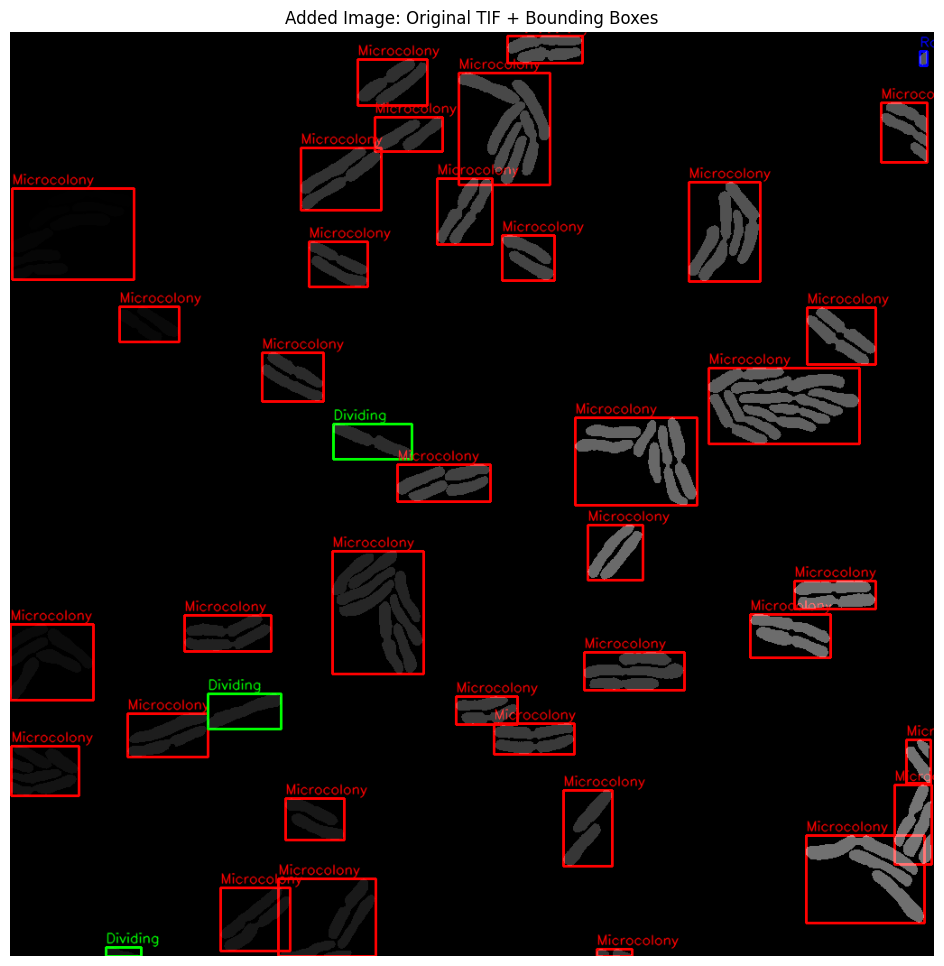

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.measure import regionprops
import tifffile

###############################################################################
# 1) Read the ground-truth color mask (TIFF) and convert to integer labels
###############################################################################

tif_path = "/content/pos2_fr_80.tif"  # <-- Update with your path
color_mask = tifffile.imread(tif_path)  # shape could be (H, W, 3) if RGB

if len(color_mask.shape) == 3 and color_mask.shape[2] == 3:
    h, w, _ = color_mask.shape
    color2label = {}
    label_image = np.zeros((h, w), dtype=np.int32)
    current_label = 1

    for row in range(h):
        for col in range(w):
            pixel_color = tuple(color_mask[row, col])  # (R, G, B)
            if pixel_color == (0, 0, 0):
                continue

            if pixel_color not in color2label:
                color2label[pixel_color] = current_label
                current_label += 1

            label_image[row, col] = color2label[pixel_color]

    final_labels = label_image
else:
    final_labels = color_mask

###############################################################################
# 2) Prepare BFS adjacency classification (Rod, Dividing, Microcolony)
###############################################################################

MIN_ROD_AREA = 5
DIVIDING_ASPECT_RATIO = 3.0
MICROCOLONY_AREA_THRESHOLD = 400
DISTANCE_THRESHOLD = 50

h, w = final_labels.shape
output_for_drawing = np.zeros((h, w, 3), dtype=np.uint8)

props = regionprops(final_labels)
objects_data = []
for prop in props:
    label_id = prop.label
    if label_id == 0:
        continue
    area = prop.area
    if area < MIN_ROD_AREA:
        continue
    major_len = prop.major_axis_length
    minor_len = prop.minor_axis_length + 1e-5
    aspect_ratio = major_len / minor_len
    centroid = prop.centroid
    bbox = prop.bbox

    objects_data.append({
        'label': label_id,
        'area': area,
        'aspect_ratio': aspect_ratio,
        'centroid': centroid,
        'bbox': bbox
    })

N = len(objects_data)
adj_list = [[] for _ in range(N)]

for i in range(N):
    r1, c1 = objects_data[i]['centroid']
    for j in range(i + 1, N):
        r2, c2 = objects_data[j]['centroid']
        dist = np.sqrt((r1 - r2)**2 + (c1 - c2)**2)
        if dist < DISTANCE_THRESHOLD:
            adj_list[i].append(j)
            adj_list[j].append(i)

visited = [False] * N
clusters = []

for i in range(N):
    if not visited[i]:
        queue = [i]
        visited[i] = True
        cluster_indices = []

        while queue:
            current = queue.pop(0)
            cluster_indices.append(current)
            for neigh in adj_list[current]:
                if not visited[neigh]:
                    visited[neigh] = True
                    queue.append(neigh)

        clusters.append(cluster_indices)

def get_cluster_bbox(cluster_idxs, data_list):
    minr = float('inf')
    minc = float('inf')
    maxr = -1
    maxc = -1
    total_area = 0
    for idx in cluster_idxs:
        r1, c1, r2, c2 = data_list[idx]['bbox']
        minr = min(minr, r1)
        minc = min(minc, c1)
        maxr = max(maxr, r2)
        maxc = max(maxc, c2)
        total_area += data_list[idx]['area']
    return (minr, minc, maxr, maxc, total_area)

COLOR_MAP = {
    "Microcolony": (0, 0, 255),
    "Dividing":     (0, 255, 0),
    "Rod":          (255, 0, 0),
}

for cluster in clusters:
    minr, minc, maxr, maxc, total_area = get_cluster_bbox(cluster, objects_data)
    cluster_size = len(cluster)

    if cluster_size > 1:
        if total_area > MICROCOLONY_AREA_THRESHOLD:
            class_name = "Microcolony"
        else:
            class_name = "Microcolony"
    else:
        idx = cluster[0]
        aspect_ratio = objects_data[idx]['aspect_ratio']
        if aspect_ratio > DIVIDING_ASPECT_RATIO:
            class_name = "Dividing"
        else:
            class_name = "Rod"

    color = COLOR_MAP[class_name]
    cv2.rectangle(output_for_drawing, (minc, minr), (maxc, maxr), color, 2)
    cv2.putText(
        output_for_drawing,
        class_name,
        (minc, max(minr - 5, 0)),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,
        color,
        1,
        cv2.LINE_AA
    )

###############################################################################
# 3) Add the two images without transparency
###############################################################################

if len(color_mask.shape) == 3 and color_mask.shape[2] == 3:
    color_mask_bgr = cv2.cvtColor(color_mask, cv2.COLOR_RGB2BGR)
else:
    color_mask_bgr = cv2.merge([color_mask, color_mask, color_mask])

final_image = cv2.bitwise_or(color_mask_bgr, output_for_drawing)

final_rgb = cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 12))
plt.imshow(final_rgb)
plt.title("Added Image: Original TIF + Bounding Boxes")
plt.axis("off")
plt.show()


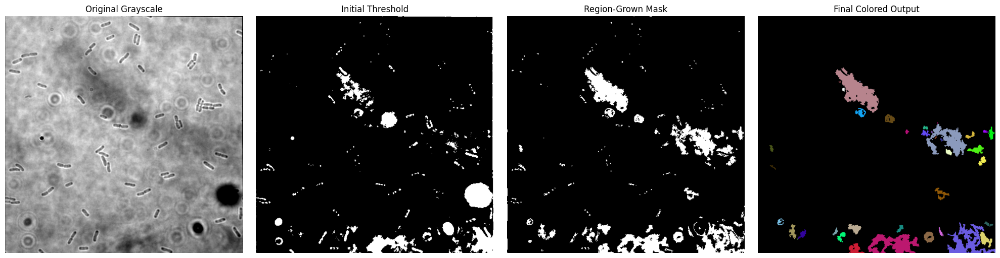

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import remove_small_objects

def region_growing(image, seeds, tolerance=15):
    """
    A simple region-growing implementation.
    image: Grayscale image (numpy array)
    seeds: List of (x, y) tuples as seed points
    tolerance: Intensity difference threshold
    Returns a binary mask of grown regions.
    """
    # Prepare output mask
    h, w = image.shape
    mask = np.zeros((h, w), dtype=np.uint8)

    # Directions (8-connectivity)
    directions = [(-1, 0), (1, 0), (0, -1), (0, 1),
                  (-1, -1), (-1, 1), (1, -1), (1, 1)]

    for seed in seeds:
        # BFS or DFS stack
        stack = [seed]
        seed_intensity = image[seed[1], seed[0]]

        while stack:
            x, y = stack.pop()
            # If already visited, skip
            if mask[y, x] == 255:
                continue

            mask[y, x] = 255  # Mark as visited

            # Check neighbors
            for dx, dy in directions:
                nx, ny = x + dx, y + dy
                if 0 <= nx < w and 0 <= ny < h:
                    if mask[ny, nx] == 0:  # not visited
                        intensity_diff = abs(int(image[ny, nx]) - int(seed_intensity))
                        if intensity_diff < tolerance:
                            stack.append((nx, ny))

    return mask

# -------------------------------------------------------
# EXAMPLE PIPELINE
# -------------------------------------------------------
# 1) Load image
image_path = "/content/pos2_fr_1.tif"
gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# 2) Simple Threshold
#    (You can also use adaptive threshold or Otsu, depending on your image)
_, binary = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY_INV)

# 3) Identify potential seeds (e.g., bright spots or connected components)
#    For demonstration, let's pick the centroids of connected components.
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)

# 4) Region Growing
#    We'll grow from each centroid if it's within a region of interest.
#    Typically, you might filter centroids by area, shape, or intensity.
seeds = []
for i in range(1, num_labels):  # skip background
    x_center, y_center = centroids[i]
    # Round to int
    x_center, y_center = int(x_center), int(y_center)
    seeds.append((x_center, y_center))

# Grow regions from these seeds
grown_mask = np.zeros_like(binary)
for s in seeds:
    # Grow each region with a tolerance
    region_mask = region_growing(gray, [s], tolerance=15)
    grown_mask = cv2.bitwise_or(grown_mask, region_mask)

# 5) Remove small noisy regions
grown_bool = grown_mask.astype(bool)
clean_mask = remove_small_objects(grown_bool, min_size=200)  # adjust min_size
clean_mask = (clean_mask * 255).astype(np.uint8)

# 6) Optional Morphological Operations to Enhance Separation
kernel = np.ones((3, 3), np.uint8)
clean_mask = cv2.morphologyEx(clean_mask, cv2.MORPH_OPEN, kernel, iterations=1)

# 7) Final Connected Component Analysis for Labeling
num_labels_final, labels_final = cv2.connectedComponents(clean_mask, connectivity=8)

# Create color output for each label
h, w = gray.shape
colored_output = np.zeros((h, w, 3), dtype=np.uint8)
for label_id in range(1, num_labels_final):
    color = np.random.randint(0, 255, size=3, dtype=np.uint8)
    colored_output[labels_final == label_id] = color

# -------------------------------------------------------
# Display Results
# -------------------------------------------------------
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
axes[0].imshow(gray, cmap='gray')
axes[0].set_title("Original Grayscale")

axes[1].imshow(binary, cmap='gray')
axes[1].set_title("Initial Threshold")

axes[2].imshow(grown_mask, cmap='gray')
axes[2].set_title("Region-Grown Mask")

axes[3].imshow(colored_output)
axes[3].set_title("Final Colored Output")

for ax in axes:
    ax.axis("off")

plt.tight_layout()
plt.show()


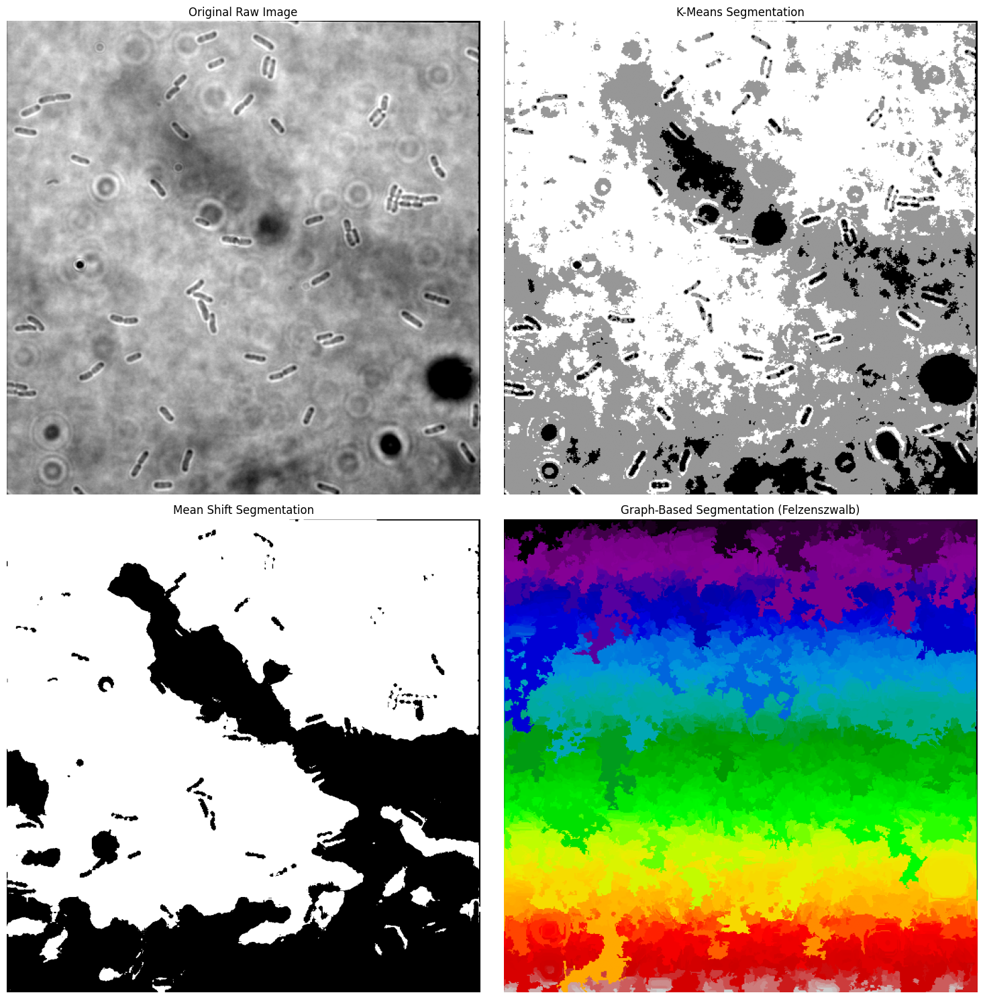

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import felzenszwalb

# -------------------------
# 1. LOAD RAW INPUT IMAGE (Grayscale)
# -------------------------
image_path = "pos2_fr_1.tif"  # Update with your file path
raw = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
if raw is None:
    raise FileNotFoundError("Image not found, please check the file path.")

# -------------------------
# 2. K-MEANS SEGMENTATION
# -------------------------
# Reshape image to a 2D array of pixels
Z = raw.reshape((-1, 1))
Z = np.float32(Z)

# Define criteria and apply kmeans
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
K = 3  # Number of clusters (adjust as needed)
ret, label, center = cv2.kmeans(Z, K, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# Convert center values to uint8 and reshape back to original image shape
center = np.uint8(center)
res = center[label.flatten()]
kmeans_segmented = res.reshape(raw.shape)

# -------------------------
# 3. MEAN SHIFT SEGMENTATION
# -------------------------
# Convert raw image to BGR so that pyrMeanShiftFiltering can work (it expects a color image)
raw_color = cv2.cvtColor(raw, cv2.COLOR_GRAY2BGR)
# Apply Mean Shift Filtering
sp = 21  # Spatial window radius
sr = 51  # Color window radius
mean_shift = cv2.pyrMeanShiftFiltering(raw_color, sp, sr)
# Convert filtered result back to grayscale
mean_shift_gray = cv2.cvtColor(mean_shift, cv2.COLOR_BGR2GRAY)
# Use Otsu's thresholding to obtain a binary segmentation map
_, mean_shift_segmented = cv2.threshold(mean_shift_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# -------------------------
# 4. GRAPH-BASED SEGMENTATION (Felzenszwalb)
# -------------------------
# Felzenszwalb works with color images; convert raw grayscale to RGB
raw_color_float = cv2.cvtColor(raw, cv2.COLOR_GRAY2RGB)
# Apply Felzenszwalb segmentation (parameters can be tuned)
graph_segmented = felzenszwalb(raw_color_float, scale=100, sigma=0.5, min_size=50)

# -------------------------
# 5. DISPLAY RESULTS
# -------------------------
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
axes = axes.ravel()

axes[0].imshow(raw, cmap="gray")
axes[0].set_title("Original Raw Image")

axes[1].imshow(kmeans_segmented, cmap="gray")
axes[1].set_title("K-Means Segmentation")

axes[2].imshow(mean_shift_segmented, cmap="gray")
axes[2].set_title("Mean Shift Segmentation")

axes[3].imshow(graph_segmented, cmap="nipy_spectral")
axes[3].set_title("Graph-Based Segmentation (Felzenszwalb)")

for ax in axes:
    ax.axis("off")

plt.tight_layout()
plt.show()


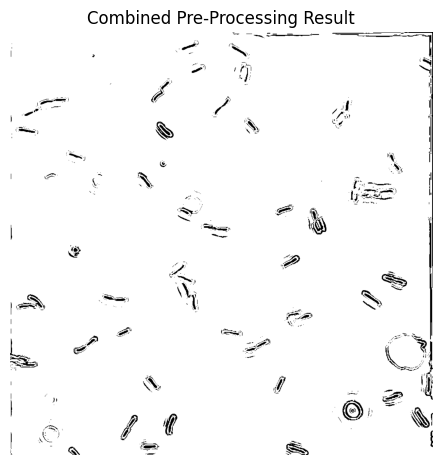

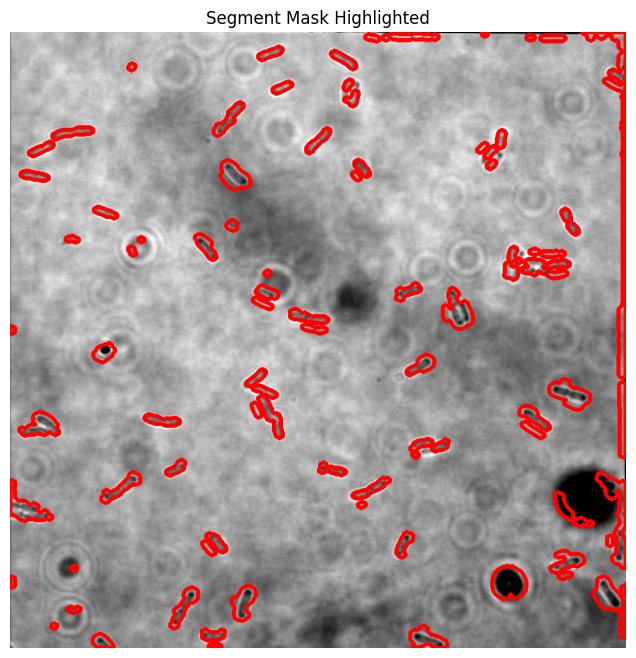

True

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import frangi
from sklearn.cluster import KMeans

def microplastic_segmentation_color_nlm(image_path):
    # 1. Load image with verification
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError("Image not found or invalid format")

    # 2. Apply Color Non-Local Means Denoising
    nlm_denoised = cv2.fastNlMeansDenoisingColored(
        image,
        h=10,
        hColor=10,
        templateWindowSize=7,
        searchWindowSize=21
    )

    # 3. Convert to grayscale for edge detection and Frangi filter
    gray = cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2GRAY)

    # 4. Enhanced Canny edges with dilation
    edges = cv2.Canny(gray, threshold1=25, threshold2=55)
    dilated_edges = cv2.dilate(edges, kernel=np.ones((3,3), np.uint8), iterations=2)

    # 5. K-means clustering on COLOR features
    def color_kmeans_mask(img, k=3):
        pixels = img.reshape(-1, 3).astype(np.float32)  # Use all 3 color channels
        kmeans = KMeans(n_clusters=k, random_state=0).fit(pixels)
        return kmeans.labels_.reshape(img.shape[:2])  # Return 2D mask

    color_mask = color_kmeans_mask(nlm_denoised)

    # 6. Frangi filter on grayscale
    frangi_enhanced = frangi(gray, sigmas=range(1, 4), beta=0.75, gamma=10)
    frangi_enhanced = cv2.normalize(frangi_enhanced, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # 7. Combine segmentation approaches
    mask = (color_mask == 1).astype(np.uint8) * 255
    edge_mask = cv2.bitwise_and(dilated_edges, mask)

    combined = cv2.bitwise_or(
        edge_mask,
        cv2.adaptiveThreshold(frangi_enhanced, 255,
                              cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                              cv2.THRESH_BINARY, 11, 2)
    )

    # NEW: Explicit combined result visualization
    plt.figure(figsize=(12, 6))
    plt.subplot(121), plt.imshow(combined, cmap='gray')
    plt.title('Combined Pre-Processing Result')
    plt.axis('off')

    # 8. Morphological refinement
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    refined = cv2.morphologyEx(combined, cv2.MORPH_CLOSE, kernel, iterations=1)
    refined = cv2.morphologyEx(refined, cv2.MORPH_OPEN, kernel, iterations=5)

    # ----- NEW: Remove Small Circular Objects from "refined" -----
    # Use connected components to filter out small circles.
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(refined, connectivity=8)
    refined_no_small = np.zeros_like(refined)
    # Set thresholds: adjust these values as needed.
    min_area_threshold = 200      # Minimum area to keep a component.
    aspect_ratio_low = 0.8        # Lower bound for nearly circular shape.
    aspect_ratio_high = 1.2       # Upper bound for nearly circular shape.

    for label in range(1, num_labels):  # skip background label 0
        area = stats[label, cv2.CC_STAT_AREA]
        if area < min_area_threshold:
            # Compute bounding box and aspect ratio
            x = stats[label, cv2.CC_STAT_LEFT]
            y = stats[label, cv2.CC_STAT_TOP]
            w = stats[label, cv2.CC_STAT_WIDTH]
            h = stats[label, cv2.CC_STAT_HEIGHT]
            if w > 0 and h > 0:
                aspect_ratio = w / h if w/h < 1 else h / w  # ratio <= 1
                # Remove if it is small and nearly circular
                if aspect_ratio_low <= aspect_ratio <= aspect_ratio_high:
                    continue
        # Retain the component in the refined mask.
        refined_no_small[labels == label] = 255

    # ----- NEW: Highlight Segmentation Boundaries -----
    # Invert refined_no_small so that objects become white.
    inv_refined = cv2.bitwise_not(refined_no_small)

    # Dilate the inverted mask to merge nearby boundaries.
    kernel_highlight = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    dilated_for_contours = cv2.dilate(inv_refined, kernel_highlight, iterations=2)

    # Find contours on the dilated mask.
    contours, _ = cv2.findContours(dilated_for_contours, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw the contours on a copy of the original image with a thick line.
    highlighted = image.copy()
    cv2.drawContours(highlighted, contours, -1, (0, 0, 255), thickness=5)

    # Display the highlighted segmentation.
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(highlighted, cv2.COLOR_BGR2RGB))
    plt.title("Segment Mask Highlighted")
    plt.axis("off")
    plt.show()

    # Optionally, save the highlighted result.
    cv2.imwrite("highlighted_segmentation.png", highlighted)

    # For the final result, you can choose to return the refined_no_small mask.
    return refined_no_small

result = microplastic_segmentation_color_nlm("/content/pos2_fr_1.tif")
cv2.imwrite("color_nlm_segmentation_result.png", result)


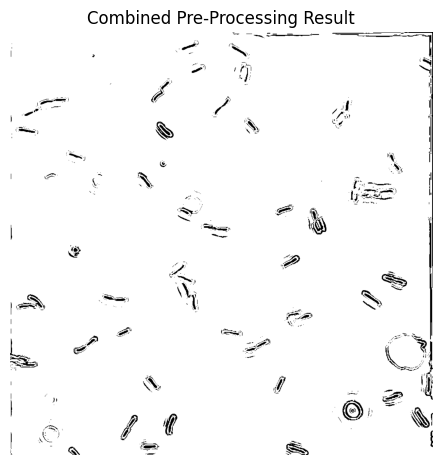

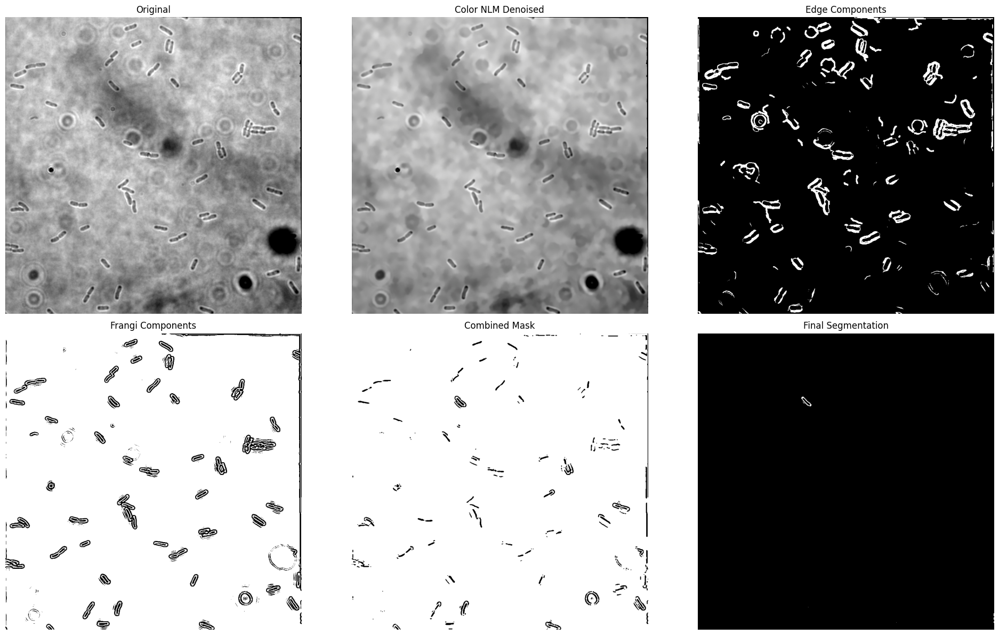

True

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import frangi
from sklearn.cluster import KMeans

def microplastic_segmentation_color_nlm(image_path):
     # 1. Load image with verification
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError("Image not found or invalid format")

    # 2. Apply Color Non-Local Means Denoising
    nlm_denoised = cv2.fastNlMeansDenoisingColored(
        image,
        h=10,
        hColor=10,
        templateWindowSize=7,
        searchWindowSize=21
    )

    # 3. Convert to grayscale for edge detection and Frangi filter
    gray = cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2GRAY)

    # 4. Enhanced Canny edges with dilation
    edges = cv2.Canny(gray, threshold1=25, threshold2=55)
    dilated_edges = cv2.dilate(edges, kernel=np.ones((3,3), np.uint8), iterations=2)

    # 5. K-means clustering on COLOR features
    def color_kmeans_mask(img, k=3):
        pixels = img.reshape(-1, 3).astype(np.float32)  # Use all 3 color channels
        kmeans = KMeans(n_clusters=k, random_state=0).fit(pixels)
        return kmeans.labels_.reshape(img.shape[:2])  # Return 2D mask

    color_mask = color_kmeans_mask(nlm_denoised)

    # 6. Frangi filter on grayscale
    frangi_enhanced = frangi(gray, sigmas=range(1, 4), beta=0.75, gamma=10)
    frangi_enhanced = cv2.normalize(frangi_enhanced, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)


    # 7. Combine segmentation approaches
    mask = (color_mask == 1).astype(np.uint8) * 255
    edge_mask = cv2.bitwise_and(dilated_edges, mask)

    combined = cv2.bitwise_or(
        edge_mask,
        cv2.adaptiveThreshold(frangi_enhanced, 255,
                            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                            cv2.THRESH_BINARY, 11, 2)
    )

    # NEW: Explicit combined result visualization
    plt.figure(figsize=(12, 6))
    plt.subplot(121), plt.imshow(combined, cmap='gray')
    plt.title('Combined Pre-Processing Result')
    plt.axis('off')

     # 8. Morphological refinement
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    refined = cv2.morphologyEx(combined, cv2.MORPH_CLOSE, kernel, iterations=1)
    # refined = cv2.morphologyEx(refined, cv2.MORPH_OPEN, kernel, iterations=1)

    # 9. Final cleanup
    _, markers = cv2.connectedComponents(refined)
    result = np.uint8(255 * (markers > 1))

    # Modified visualization to show progression
    plt.figure(figsize=(20, 12))
    stages = [
        ("Original", cv2.cvtColor(image, cv2.COLOR_BGR2RGB)),
        ("Color NLM Denoised", cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2RGB)),
        ("Edge Components", edge_mask),
        ("Frangi Components", cv2.adaptiveThreshold(frangi_enhanced, 255,
                                                   cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                                   cv2.THRESH_BINARY, 11, 2)),
        ("Combined Mask", refined),
        ("Final Segmentation", result)
    ]

    for i, (title, img) in enumerate(stages):
        plt.subplot(2, 3, i+1)
        if title in ["Original", "Color NLM Denoised"]:
            plt.imshow(img)
        else:
            plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    return result

result = microplastic_segmentation_color_nlm("pos2_fr_1.tif")
cv2.imwrite("color_nlm_segmentation_result.png", result)

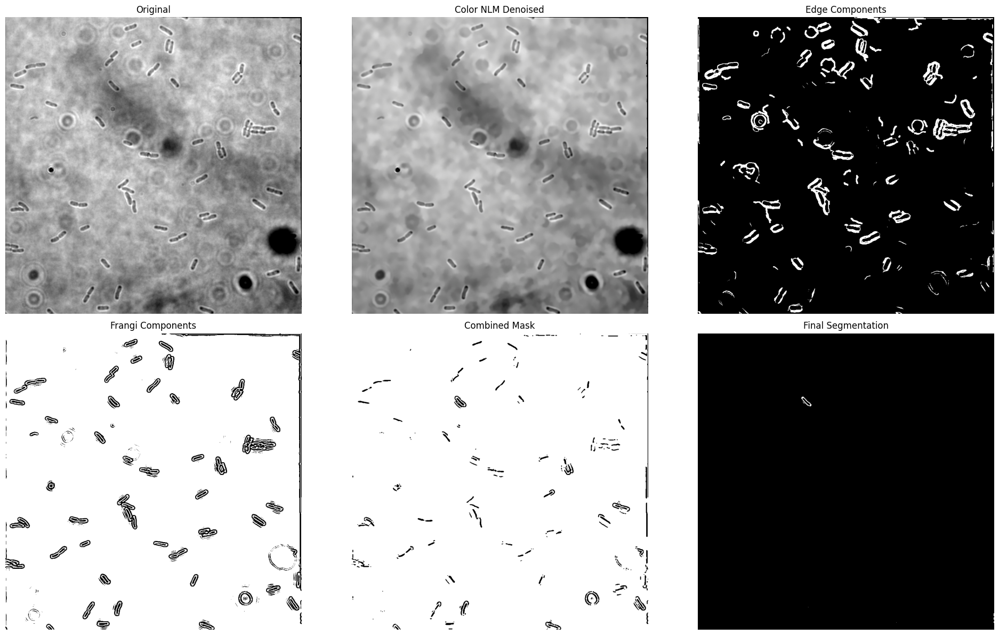

Transformed image saved as transformed_frangi_components.png


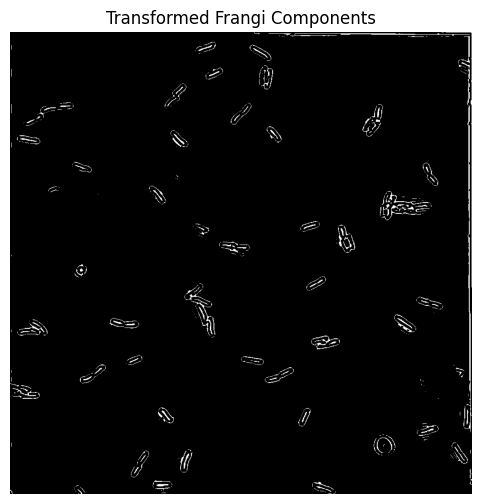

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import frangi
from sklearn.cluster import KMeans

# Original segmentation function (modified to return Frangi Components)
def microplastic_segmentation_color_nlm(image_path):
    # 1. Load image with verification
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError("Image not found or invalid format")

    # 2. Apply Color Non-Local Means Denoising
    nlm_denoised = cv2.fastNlMeansDenoisingColored(
        image,
        h=10,
        hColor=10,
        templateWindowSize=7,
        searchWindowSize=21
    )

    # 3. Convert to grayscale for edge detection and Frangi filter
    gray = cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2GRAY)

    # 4. Enhanced Canny edges with dilation
    edges = cv2.Canny(gray, threshold1=25, threshold2=55)
    dilated_edges = cv2.dilate(edges, kernel=np.ones((3,3), np.uint8), iterations=2)

    # 5. K-means clustering on COLOR features
    def color_kmeans_mask(img, k=3):
        pixels = img.reshape(-1, 3).astype(np.float32)  # Use all 3 color channels
        kmeans = KMeans(n_clusters=k, random_state=0).fit(pixels)
        return kmeans.labels_.reshape(img.shape[:2])  # Return 2D mask

    color_mask = color_kmeans_mask(nlm_denoised)

    # 6. Frangi filter on grayscale
    frangi_enhanced = frangi(gray, sigmas=range(1, 4), beta=0.75, gamma=10)
    frangi_enhanced = cv2.normalize(frangi_enhanced, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # 7. Generate Frangi Components (intermediate result)
    frangi_components = cv2.adaptiveThreshold(frangi_enhanced, 255,
                                              cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                              cv2.THRESH_BINARY, 11, 2)

    # 8. Combine segmentation approaches (rest of the original pipeline)
    mask = (color_mask == 1).astype(np.uint8) * 255
    edge_mask = cv2.bitwise_and(dilated_edges, mask)

    combined = cv2.bitwise_or(
        edge_mask,
        frangi_components
    )

    # 9. Morphological refinement
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    refined = cv2.morphologyEx(combined, cv2.MORPH_CLOSE, kernel, iterations=1)

    # 10. Final cleanup
    _, markers = cv2.connectedComponents(refined)
    result = np.uint8(255 * (markers > 1))

    # Save Frangi Components Image
    frangi_image_path = "frangi_components_output.png"
    cv2.imwrite(frangi_image_path, frangi_components)  # Save the Frangi components

    # Visualization (optional, can be removed if not needed)
    plt.figure(figsize=(20, 12))
    stages = [
        ("Original", cv2.cvtColor(image, cv2.COLOR_BGR2RGB)),
        ("Color NLM Denoised", cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2RGB)),
        ("Edge Components", edge_mask),
        ("Frangi Components", frangi_components),
        ("Combined Mask", refined),
        ("Final Segmentation", result)
    ]

    for i, (title, img) in enumerate(stages):
        plt.subplot(2, 3, i+1)
        if title in ["Original", "Color NLM Denoised"]:
            plt.imshow(img)
        else:
            plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    return result, frangi_components  # Return both final result and Frangi Components

# New transformation function to process the Frangi Components

if __name__ == "__main__":
    # Replace 'pos2_fr_1.tif' with the path to your input image
    final_result, frangi_components = microplastic_segmentation_color_nlm("pos2_fr_1.tif")
    transformed_image = transform_frangi_components(frangi_components)

    # Optional: Display the transformed image
    plt.figure(figsize=(6, 6))
    plt.imshow(transformed_image, cmap='gray')
    plt.title('Transformed Frangi Components')
    plt.axis('off')
    plt.show()


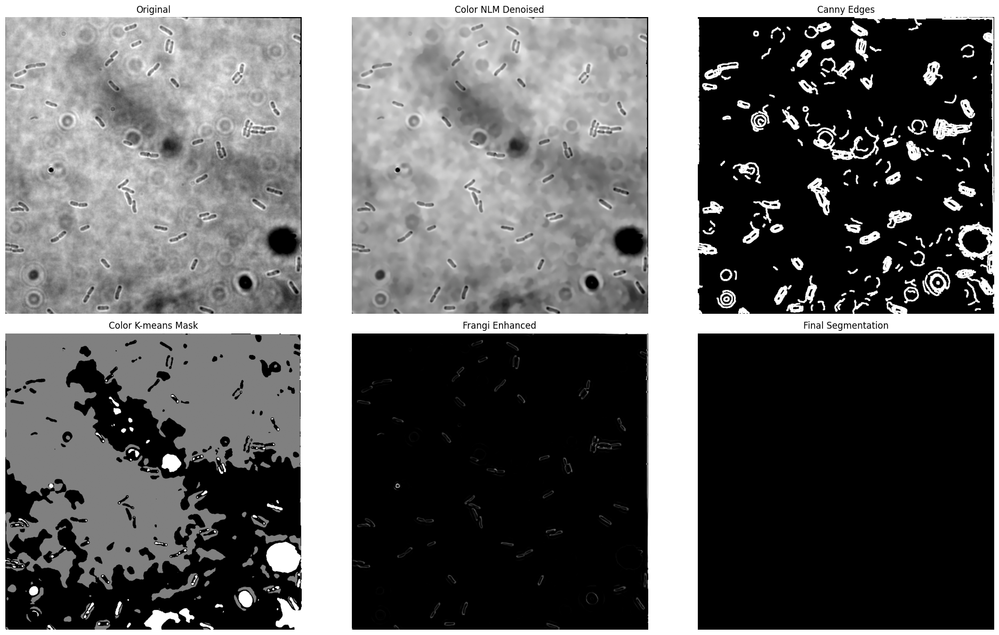

True

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import frangi
from sklearn.cluster import KMeans

def microplastic_segmentation_color_nlm(image_path):
    # 1. Load image with verification
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError("Image not found or invalid format")

    # 2. Apply Color Non-Local Means Denoising
    nlm_denoised = cv2.fastNlMeansDenoisingColored(
        image,
        h=10,
        hColor=10,
        templateWindowSize=7,
        searchWindowSize=21
    )

    # 3. Convert to grayscale for edge detection and Frangi filter
    gray = cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2GRAY)

    # 4. Enhanced Canny edges with dilation
    edges = cv2.Canny(gray, threshold1=25, threshold2=55)
    dilated_edges = cv2.dilate(edges, kernel=np.ones((3,3), np.uint8), iterations=2)

    # 5. K-means clustering on COLOR features
    def color_kmeans_mask(img, k=3):
        pixels = img.reshape(-1, 3).astype(np.float32)  # Use all 3 color channels
        kmeans = KMeans(n_clusters=k, random_state=0).fit(pixels)
        return kmeans.labels_.reshape(img.shape[:2])  # Return 2D mask

    color_mask = color_kmeans_mask(nlm_denoised)

    # 6. Frangi filter on grayscale
    frangi_enhanced = frangi(gray, sigmas=range(1, 4), beta=0.75, gamma=10)
    frangi_enhanced = cv2.normalize(frangi_enhanced, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # 7. Combine segmentation approaches (ensure matching dimensions)
    # Convert color mask to 8-bit single channel
    mask = (color_mask == 1).astype(np.uint8) * 255
    edge_mask = cv2.bitwise_and(dilated_edges, mask)

    # Combine with Frangi-enhanced
    combined = cv2.bitwise_or(
        edge_mask,
        cv2.adaptiveThreshold(frangi_enhanced, 255,
                             cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                             cv2.THRESH_BINARY, 11, 2)
    )

    # 8. Morphological refinement
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    refined = cv2.morphologyEx(combined, cv2.MORPH_CLOSE, kernel, iterations=2)
    refined = cv2.morphologyEx(refined, cv2.MORPH_OPEN, kernel, iterations=1)

    # 9. Final cleanup
    _, markers = cv2.connectedComponents(refined)
    result = np.uint8(255 * (markers > 1))

    # Visualization
    plt.figure(figsize=(20, 12))
    stages = [
        ("Original", cv2.cvtColor(image, cv2.COLOR_BGR2RGB)),
        ("Color NLM Denoised", cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2RGB)),
        ("Canny Edges", dilated_edges),
        ("Color K-means Mask", color_mask*80),
        ("Frangi Enhanced", frangi_enhanced),
        ("Final Segmentation", result)
    ]

    for i, (title, img) in enumerate(stages):
        plt.subplot(2, 3, i+1)
        if title in ["Original", "Color NLM Denoised"]:
            plt.imshow(img)
        else:
            plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    return result

# Usage
result = microplastic_segmentation_color_nlm("/content/pos2_fr_1.tif")
cv2.imwrite("color_nlm_segmentation_result.png", result)

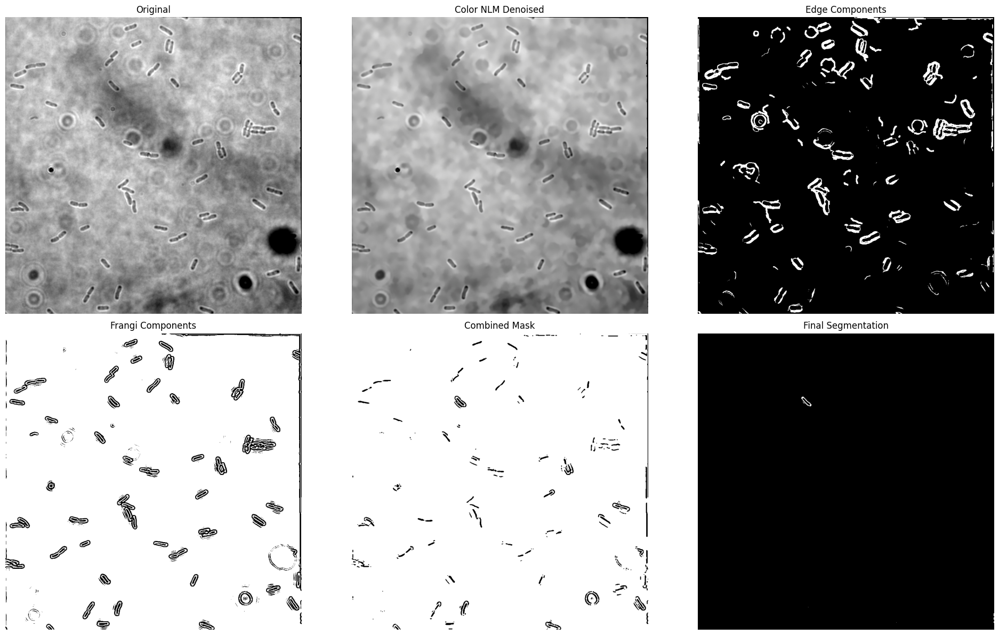

Transformed image saved as transformed_frangi_components.png


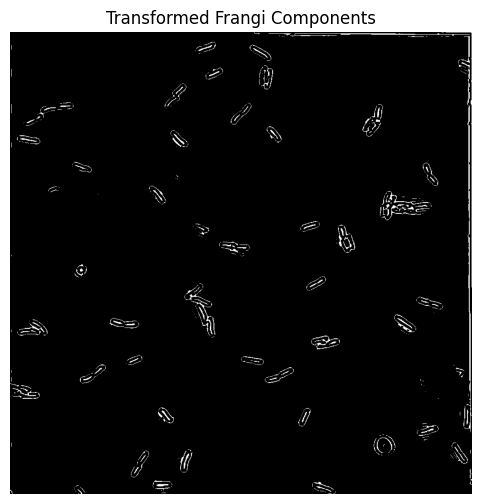

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import frangi
from sklearn.cluster import KMeans

# Original segmentation function (slightly modified to return Frangi Components)
def microplastic_segmentation_color_nlm(image_path):
    # 1. Load image with verification
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError("Image not found or invalid format")

    # 2. Apply Color Non-Local Means Denoising
    nlm_denoised = cv2.fastNlMeansDenoisingColored(
        image,
        h=10,
        hColor=10,
        templateWindowSize=7,
        searchWindowSize=21
    )

    # 3. Convert to grayscale for edge detection and Frangi filter
    gray = cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2GRAY)

    # 4. Enhanced Canny edges with dilation
    edges = cv2.Canny(gray, threshold1=25, threshold2=55)
    dilated_edges = cv2.dilate(edges, kernel=np.ones((3,3), np.uint8), iterations=2)

    # 5. K-means clustering on COLOR features
    def color_kmeans_mask(img, k=3):
        pixels = img.reshape(-1, 3).astype(np.float32)  # Use all 3 color channels
        kmeans = KMeans(n_clusters=k, random_state=0).fit(pixels)
        return kmeans.labels_.reshape(img.shape[:2])  # Return 2D mask

    color_mask = color_kmeans_mask(nlm_denoised)

    # 6. Frangi filter on grayscale
    frangi_enhanced = frangi(gray, sigmas=range(1, 4), beta=0.75, gamma=10)
    frangi_enhanced = cv2.normalize(frangi_enhanced, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # 7. Generate Frangi Components (intermediate result)
    frangi_components = cv2.adaptiveThreshold(frangi_enhanced, 255,
                                            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                            cv2.THRESH_BINARY, 11, 2)

    # 8. Combine segmentation approaches (rest of the original pipeline)
    mask = (color_mask == 1).astype(np.uint8) * 255
    edge_mask = cv2.bitwise_and(dilated_edges, mask)

    combined = cv2.bitwise_or(
        edge_mask,
        frangi_components
    )

    # 9. Morphological refinement
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    refined = cv2.morphologyEx(combined, cv2.MORPH_CLOSE, kernel, iterations=1)

    # 10. Final cleanup
    _, markers = cv2.connectedComponents(refined)
    result = np.uint8(255 * (markers > 1))

    # Visualization (optional, can be removed if not needed)
    plt.figure(figsize=(20, 12))
    stages = [
        ("Original", cv2.cvtColor(image, cv2.COLOR_BGR2RGB)),
        ("Color NLM Denoised", cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2RGB)),
        ("Edge Components", edge_mask),
        ("Frangi Components", frangi_components),
        ("Combined Mask", refined),
        ("Final Segmentation", result)
    ]

    for i, (title, img) in enumerate(stages):
        plt.subplot(2, 3, i+1)
        if title in ["Original", "Color NLM Denoised"]:
            plt.imshow(img)
        else:
            plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    return result, frangi_components  # Return both final result and Frangi Components

# New transformation function to process the Frangi Components
def transform_frangi_components(frangi_image):
    # Step 1: Ensure the image is in the correct format (grayscale)
    if len(frangi_image.shape) == 3:
        frangi_image = cv2.cvtColor(frangi_image, cv2.COLOR_BGR2GRAY)

    # Step 2: Color Inversion
    inverted_image = cv2.bitwise_not(frangi_image)

    # Step 3: Noise Removal (optional, using threshold and erosion)
    _, binary_image = cv2.threshold(inverted_image, 128, 255, cv2.THRESH_BINARY)
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.erode(binary_image, kernel, iterations=1)

    # Step 4: Save the output image
    output_image_path = 'transformed_frangi_components.png'
    cv2.imwrite(output_image_path, cleaned_image)

    print(f"Transformed image saved as {output_image_path}")
    return cleaned_image

# Execute the pipeline
if __name__ == "__main__":
    # Replace 'pos2_fr_1.tif' with the path to your input image
    final_result, frangi_components = microplastic_segmentation_color_nlm("pos2_fr_1.tif")
    transformed_image = transform_frangi_components(frangi_components)

    # Optional: Display the transformed image
    plt.figure(figsize=(6, 6))
    plt.imshow(transformed_image, cmap='gray')
    plt.title('Transformed Frangi Components')
    plt.axis('off')
    plt.show()

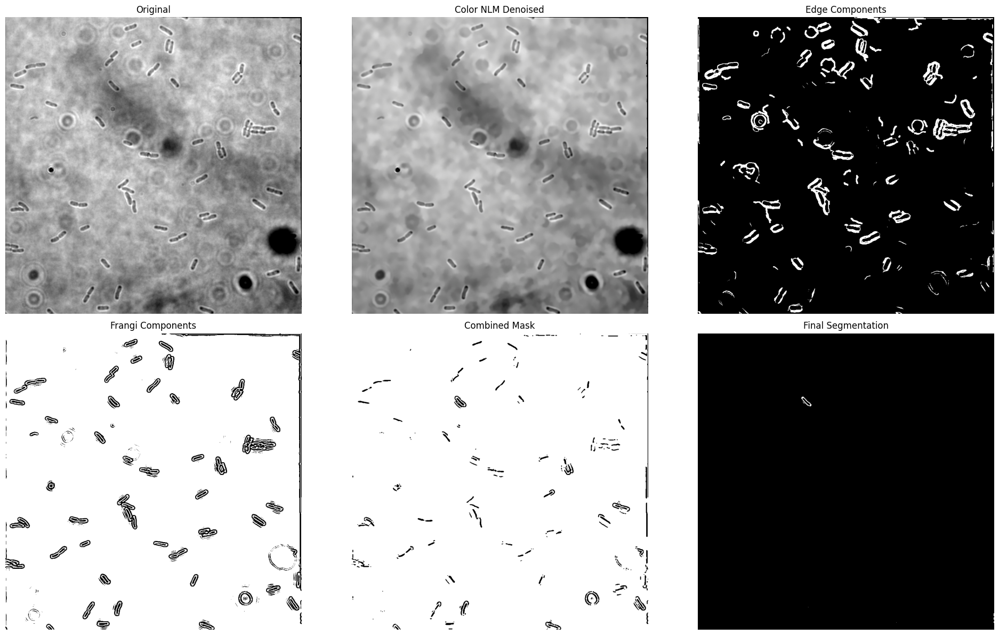

Transformed image saved as transformed_frangi_components.png


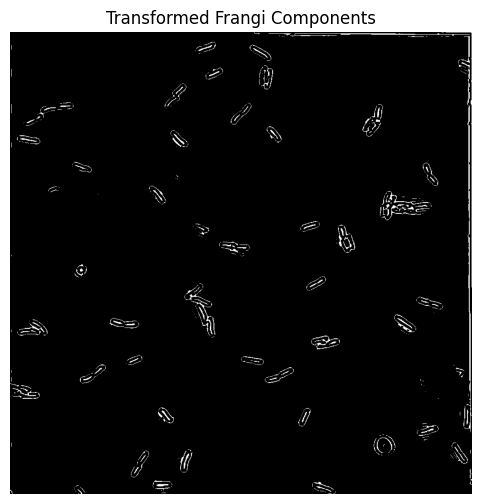

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import frangi
from sklearn.cluster import KMeans

# Original segmentation function (modified to return Frangi Components)
def microplastic_segmentation_color_nlm(image_path):
    # 1. Load image with verification
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError("Image not found or invalid format")

    # 2. Apply Color Non-Local Means Denoising
    nlm_denoised = cv2.fastNlMeansDenoisingColored(
        image,
        h=10,
        hColor=10,
        templateWindowSize=7,
        searchWindowSize=21
    )

    # 3. Convert to grayscale for edge detection and Frangi filter
    gray = cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2GRAY)

    # 4. Enhanced Canny edges with dilation
    edges = cv2.Canny(gray, threshold1=25, threshold2=55)
    dilated_edges = cv2.dilate(edges, kernel=np.ones((3,3), np.uint8), iterations=2)

    # 5. K-means clustering on COLOR features
    def color_kmeans_mask(img, k=3):
        pixels = img.reshape(-1, 3).astype(np.float32)  # Use all 3 color channels
        kmeans = KMeans(n_clusters=k, random_state=0).fit(pixels)
        return kmeans.labels_.reshape(img.shape[:2])  # Return 2D mask

    color_mask = color_kmeans_mask(nlm_denoised)

    # 6. Frangi filter on grayscale
    frangi_enhanced = frangi(gray, sigmas=range(1, 4), beta=0.75, gamma=10)
    frangi_enhanced = cv2.normalize(frangi_enhanced, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # 7. Generate Frangi Components (intermediate result)
    frangi_components = cv2.adaptiveThreshold(frangi_enhanced, 255,
                                              cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                              cv2.THRESH_BINARY, 11, 2)

    # 8. Combine segmentation approaches (rest of the original pipeline)
    mask = (color_mask == 1).astype(np.uint8) * 255
    edge_mask = cv2.bitwise_and(dilated_edges, mask)

    combined = cv2.bitwise_or(
        edge_mask,
        frangi_components
    )

    # 9. Morphological refinement
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    refined = cv2.morphologyEx(combined, cv2.MORPH_CLOSE, kernel, iterations=1)

    # 10. Final cleanup
    _, markers = cv2.connectedComponents(refined)
    result = np.uint8(255 * (markers > 1))

    # Visualization (optional, can be removed if not needed)
    plt.figure(figsize=(20, 12))
    stages = [
        ("Original", cv2.cvtColor(image, cv2.COLOR_BGR2RGB)),
        ("Color NLM Denoised", cv2.cvtColor(nlm_denoised, cv2.COLOR_BGR2RGB)),
        ("Edge Components", edge_mask),
        ("Frangi Components", frangi_components),
        ("Combined Mask", refined),
        ("Final Segmentation", result)
    ]

    for i, (title, img) in enumerate(stages):
        plt.subplot(2, 3, i+1)
        if title in ["Original", "Color NLM Denoised"]:
            plt.imshow(img)
        else:
            plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    return result, frangi_components  # Return both final result and Frangi Components

# New transformation function to process the Frangi Components

if __name__ == "__main__":
    # Replace 'pos2_fr_1.tif' with the path to your input image
    final_result, frangi_components = microplastic_segmentation_color_nlm("pos2_fr_1.tif")
    transformed_image = transform_frangi_components(frangi_components)

    # Optional: Display the transformed image
    plt.figure(figsize=(6, 6))
    plt.imshow(transformed_image, cmap='gray')
    plt.title('Transformed Frangi Components')
    plt.axis('off')
    plt.show()

Pixel Accuracy: 0.943
Precision: 0.919
Recall: 0.375
Dice Coefficient: 0.532
IoU (Jaccard Index): 0.363


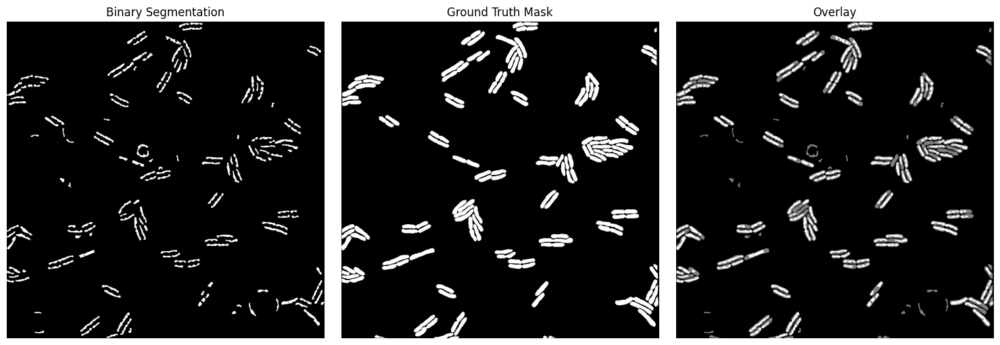

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# -------------------------
# Assume 'final_labels' is the output from your connected components analysis
# from your watershed + post-processing pipeline.
# For example, final_labels is a 2D array where background=0 and each segmented object >0.
# -------------------------

# Convert final_labels to a binary mask (rods only = 1, background = 0)
binary_segmentation = np.where(final_labels > 0, 1, 0).astype(np.uint8)

# -------------------------
# Load the Ground Truth Binary Mask
# -------------------------
# Replace 'path_to_ground_truth_mask.tif' with the actual file path to your GT mask.
gt_path = "/content/pos2_fr_80t.tif"
gt_mask = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
if gt_mask is None:
    raise FileNotFoundError("Ground truth mask not found, check your path.")

# Ensure the ground truth mask is binary (0 and 1)
gt_mask = np.where(gt_mask > 0, 1, 0).astype(np.uint8)

# -------------------------
# Calculate Evaluation Metrics
# -------------------------
# Intersection and union for IoU and Dice
intersection = np.logical_and(binary_segmentation, gt_mask).sum()
union = np.logical_or(binary_segmentation, gt_mask).sum()

iou = intersection / union if union != 0 else 0.0
dice = 2 * intersection / (binary_segmentation.sum() + gt_mask.sum()) if (binary_segmentation.sum() + gt_mask.sum()) != 0 else 0.0

# Pixel-wise accuracy
accuracy = np.mean(binary_segmentation == gt_mask)

# Precision and Recall (based on pixel counts)
# True Positive (TP): pixels correctly predicted as foreground
TP = intersection
# False Positive (FP): pixels predicted as foreground in segmentation but not in GT
FP = (binary_segmentation == 1).sum() - TP
# False Negative (FN): pixels in GT as foreground but not predicted
FN = (gt_mask == 1).sum() - TP

precision = TP / (TP + FP) if (TP + FP) != 0 else 0.0
recall = TP / (TP + FN) if (TP + FN) != 0 else 0.0

# -------------------------
# Display Metrics
# -------------------------
print(f"Pixel Accuracy: {accuracy:.3f}")
print(f"Precision: {precision:.3f}")
print(f"Recall: {recall:.3f}")
print(f"Dice Coefficient: {dice:.3f}")
print(f"IoU (Jaccard Index): {iou:.3f}")

# -------------------------
# Visualization of the Segmentation and Ground Truth
# -------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(binary_segmentation, cmap='gray')
axes[0].set_title("Binary Segmentation")
axes[1].imshow(gt_mask, cmap='gray')
axes[1].set_title("Ground Truth Mask")
# Overlay segmentation on GT for visual comparison
overlay = cv2.addWeighted(binary_segmentation*255, 0.5, gt_mask*255, 0.5, 0)
axes[2].imshow(overlay, cmap='gray')
axes[2].set_title("Overlay")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()


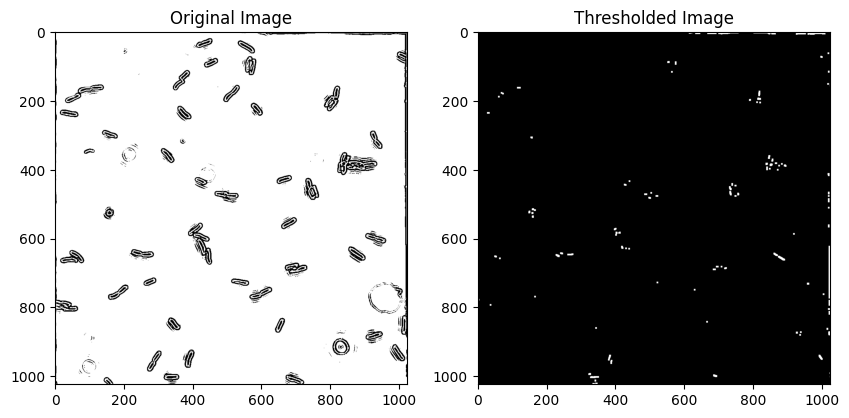

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the uploaded image
image_path = "/content/frangi_components_output.png"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Gaussian Blur to reduce noise while preserving edges
blurred = cv2.GaussianBlur(image, (5, 5), 0)

# Apply adaptive thresholding for segmentation
thresh = cv2.adaptiveThreshold(
    blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 21, 5
)

# Remove small noise using morphological opening
kernel = np.ones((3, 3), np.uint8)
thresh_cleaned = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

# Display results
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[1].imshow(thresh_cleaned, cmap='gray')
axes[1].set_title('Thresholded Image')
plt.show()


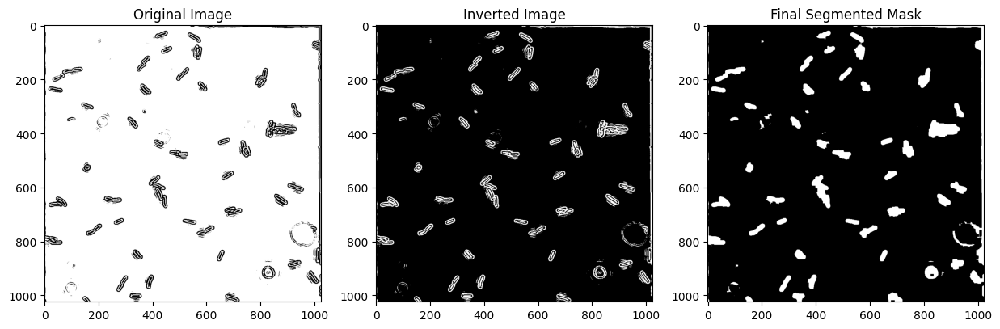

'/content/pred.png'

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image (grayscale)
image_path = "/content/frangi_components_output.png"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Invert the image
inverted = cv2.bitwise_not(image)

# Apply Gaussian Blur to reduce noise
blurred = cv2.GaussianBlur(inverted, (5, 5), 0)

# Use Otsu's Thresholding for segmentation
_, binary_mask = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Morphological closing to fill gaps inside bacteria
kernel = np.ones((5, 5), np.uint8)
closed = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel, iterations=2)

# Display results
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(image, cmap='gray')
axes[0].set_title("Original Image")
axes[1].imshow(inverted, cmap='gray')
axes[1].set_title("Inverted Image")
axes[2].imshow(closed, cmap='gray')
axes[2].set_title("Final Segmented Mask")
plt.show()

# Save the final segmented mask
output_path = "/content/pred.png"
cv2.imwrite(output_path, closed)
output_path


In [ ]:
import cv2
import numpy as np
import os
from sklearn.metrics import confusion_matrix

def load_binary_mask(path):
    """Load a binary mask, threshold it, and normalize to 0 and 1."""
    if not os.path.exists(path):
        raise FileNotFoundError(f"File not found: {path}")

    mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if mask is None:
        raise ValueError(f"Error loading image: {path}")

    _, binary_mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
    return binary_mask // 255  # Normalize to 0 and 1

def compute_metrics(gt_mask, pred_mask):
    """Compute various segmentation evaluation metrics."""
    # Flatten masks for easier computation
    gt_mask = gt_mask.flatten()
    pred_mask = pred_mask.flatten()

    # Compute confusion matrix
    tn, fp, fn, tp = confusion_matrix(gt_mask, pred_mask, labels=[0, 1]).ravel()

    # Compute standard metrics
    iou = tp / (tp + fp + fn) if (tp + fp + fn) > 0 else 0
    dice = (2 * tp) / (2 * tp + fp + fn) if (2 * tp + fp + fn) > 0 else 0
    accuracy = (tp + tn) / (tp + tn + fp + fn) if (tp + tn + fp + fn) > 0 else 0
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    balanced_accuracy = (recall + specificity) / 2

    return {
        "IoU": iou,
        "Dice Coefficient (F1 Score)": dice,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall (Sensitivity)": recall,
        "Specificity": specificity,
        "Balanced Accuracy": balanced_accuracy
    }

# Paths to masks
predicted_mask_path = "/content/pred.png"
gt_mask_path = "/content/mask.tif"

# Load masks
pred_mask = load_binary_mask(predicted_mask_path)
gt_mask = load_binary_mask(gt_mask_path)

# Ensure both masks have the same shape
if pred_mask.shape != gt_mask.shape:
    raise ValueError("Predicted and ground truth masks must have the same shape!")

# Compute and display metrics
metrics = compute_metrics(gt_mask, pred_mask)
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")


IoU: 0.4380
Dice Coefficient (F1 Score): 0.6091
Accuracy: 0.9592
Precision: 0.4395
Recall (Sensitivity): 0.9921
Specificity: 0.9581
Balanced Accuracy: 0.9751
